In [1]:
import json
import os
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats
from scipy.stats import kstest
import numpy as np
import networkx as nx
import pydot
from networkx.drawing.nx_pydot import graphviz_layout
import powerlaw
import statsmodels.api as sm
from statsmodels.api import qqplot
from datetime import datetime, timedelta
from collections import defaultdict
from tqdm import tqdm

import utils.processing_utils as pu
import utils.simulation_utils as su

np.set_printoptions(legacy="1.25")
plt.style.use("seaborn-v0_8-colorblind")
tqdm.pandas()

figsize_regular = (5, 5)
figsize_large = (8, 8)
figsize_wide = (10, 5)
figsize_ultra_wide = (15, 5)
figsize_wide_large = (12, 9)
figsize_long = (5, 10)

In [75]:
experimental_condition = True
save_figs = True
run_perspective = False
# start_str="reddit-sim_qwen_subreddit-3-24h"
if experimental_condition:
    simulated_conditions = [1, 6]

***
# Load Data

In [3]:
# Load User data and discussions data
user_data = pd.read_csv(
    "/../abyss/home/oasis/data/seed_user_data.csv"
)

discussions_data = pd.read_csv(
    "/../abyss/home/oasis/data/seed_discussions_data.csv"
)

# change post_id in two cases to fit actual post_id
discussions_data.at[679, "post_id"] = "t3_1dfbrcy"
discussions_data.at[680, "post_id"] = "t3_1dfbrcy"

if experimental_condition:
    user_data = user_data[user_data["subreddit"].isin(simulated_conditions)]
    discussions_data = discussions_data[discussions_data["subreddit"].isin(simulated_conditions)]

In [4]:
sim_discussions_dfs = []
sim_user_dfs = []
sim_trace_dfs = []

for i in range(1, 11):
    subdir = "{:02d}".format(i)
    sim_discussions_dfs.append(pd.read_csv(
    f"/../abyss/home/oasis/data/{subdir}_run/sim_discussions_data.csv"
    ))
    sim_discussions_dfs[i-1]["topic_content"] = sim_discussions_dfs[i-1]["topic_content"].str.replace("’", "'")
    sim_user_dfs.append(pd.read_csv(
    f"/../abyss/home/oasis/data/{subdir}_run/sim_user_data.csv"
    ))
    sim_trace_dfs.append(pd.read_csv(
    f"/../abyss/home/oasis/data/{subdir}_run/sim_trace_data.csv"
    ))

In [5]:
len(sim_discussions_dfs)

10

In [6]:
sim_discussions_data = pd.read_csv(
    "/../abyss/home/oasis/data/01_run/sim_discussions_data.csv"
)
sim_discussions_data["topic_content"] = sim_discussions_data["topic_content"].str.replace("’", "'")
sim_user_data = pd.read_csv(
    "/../abyss/home/oasis/data/01_run/sim_user_data.csv"
)
sim_trace_data = pd.read_csv(
    "/../abyss/home/oasis/data/01_run/sim_trace_data.csv"
)

In [7]:
# introduce topic to seed data so that seed and sim share an identifier for topic
discussions_data = discussions_data.merge(sim_discussions_data.drop_duplicates(subset="topic_content")[["topic_content", "topic"]], left_on="post_title", right_on="topic_content")

In [8]:
# Extract empirical (seed) data action histogram (estimated) 
def seed_action_hist(sub):
    data = discussions_data[discussions_data["subreddit"] == sub]
    temp_pos = data[data["score_post"] > 0]
    temp_neg = data[data["score_post"] < 0]
    
    seed_like_post = temp_pos.drop_duplicates(subset="post_id")["score_post"].sum()
    seed_dislike_post = temp_neg.drop_duplicates(subset="post_id")["score_post"].sum()
    
    seed_create_comment = len(data[data["parent_id"].isin(data["post_id"])])
    
    seed_create_comment_comment = len(data[data["parent_id"].isin(data["comment_id"])])
    
    temp_pos = data[data["score_comment"] > 0]
    temp_neg = data[data["score_comment"] < 0]
    
    seed_like_comment = temp_pos.drop_duplicates(subset="comment_id")["score_comment"].sum()
    seed_dislike_comment = abs(temp_neg.drop_duplicates(subset="comment_id")["score_comment"].sum())

    seed_action_hist = [0, seed_create_comment, seed_create_comment_comment, seed_dislike_comment, seed_dislike_post, seed_like_comment, seed_like_post]

    return seed_action_hist

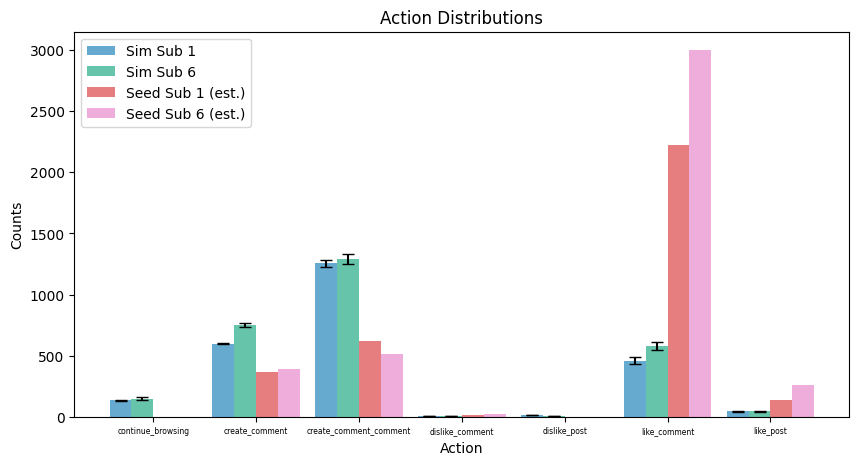

In [163]:
fig, ax = plt.subplots(1, 1, figsize=figsize_wide)
l = 0
bar_width = 0.85 / (len(sim_trace_data["subreddit"].unique())+2)

all_actions = sorted(sim_trace_data[~sim_trace_data["action"].isin(["refresh", "sign_up", "create_post"])]["action"].unique())
x = np.arange(len(all_actions))

subs = {
    1: [],
    2: [],
    3: [],
    4: [],
    5: [],
    6: [],
}

for r in sim_trace_dfs:
    for i, data in r.groupby("subreddit"):
        temp = data[~data["action"].isin(["refresh", "sign_up", "create_post"])].sort_values("action")
        cats = temp["action"].unique()
        counts = temp.groupby("action").size()
    
        # Create a dictionary to map actions to their counts
        counts_dict = dict(zip(cats, counts))
    
        # Ensure all actions are represented in the counts
        subs[i].append([counts_dict.get(action, 0) for action in all_actions])

for i in simulated_conditions:
    # Calculate the position for this set of bars
    bar_positions = x + (l - 1) * bar_width
        
    histograms = subs[i]
    # histograms = np.array(histograms)
    
    # Calculate the mean histogram
    mean_histogram = np.mean(histograms, axis=0)
    
    # Calculate the confidence intervals (e.g., 95% CI)
    confidence_intervals = 1.96 * np.std(histograms, axis=0) / np.sqrt(len(subs[i]))
    
    ax.bar(bar_positions, mean_histogram, width=bar_width, alpha=0.6, label=f"Sim Sub {i}", yerr=confidence_intervals, capsize=4)
    ax.tick_params(axis="x", labelsize=5.5)
    
    ax.set_xlabel("Action")
    ax.set_ylabel("Counts")
    ax.set_title("Action Distributions")
    ax.set_xticks(x + bar_width * (len(sim_trace_data["subreddit"].unique()) - 1) / 2)
    ax.set_xticklabels(all_actions)
    
    l += 1

for i in simulated_conditions:
    bar_positions = x + (l - 1) * bar_width

    ax.bar(bar_positions, seed_action_hist(i), width=bar_width, alpha=0.6, label=f"Seed Sub {i} (est.)", color=("tab:red" if i == 1 else "tab:pink"))
    
    l += 1


ax.legend()
if save_figs:
    plt.savefig(
        f"figures/seed-sim_dist_actions.pdf"
    )
plt.show()

***
# Structural Analysis

In [157]:
# Comparison of 

def round_mean(data, mode="mean", digits=2):
    if mode == "mean":
        return round(np.mean(data), digits)
    elif mode == "median":
        return round(np.median(data), digits)

def get_ci(x, mode="mean", q = 0.5, digits=2):
    data = x.copy()
    data.sort()
    mean, std, n = np.mean(data), np.std(data, ddof=1), len(data)
    z = 1.96
    
    error = z * (std / np.sqrt(n))

    median_error = z * np.sqrt(n*q*(1-q))

    if mode == "mean":
        return round(mean - error, digits), round(mean + error, digits)
    elif mode == "median":
        lb = int(round(n * q - median_error, 0))
        ub = int(round(n * q + median_error, 0))
        lb = max(0, lb)
        ub = min(n - 1, ub)
        return round(data[lb], digits), round(data[ub], digits) 

temp = list(user_data["comment_count"])
seed_avg_comment_count = round_mean(temp), get_ci(temp)
seed_median_comment_count = round_mean(temp, "median"), get_ci(temp, "median")

temp = list(discussions_data["score_comment"])
seed_avg_score_comment = round_mean(temp), get_ci(temp)
seed_median_score_comment = round_mean(temp, "median"), get_ci(temp, "median")

seed_min_score_comment = min(discussions_data["score_comment"])
seed_max_score_comment = max(discussions_data["score_comment"])


temp = [i for j in [i["sim_comment_count"] for i in sim_user_dfs] for i in j]
sim_avg_comment_count = (
    round_mean(temp),
    get_ci(temp)
)
sim_median_comment_count = (
    round_mean(temp, mode="median"),
    get_ci(temp, mode="median")
)

temp = [i for j in [i["sim_score_comment"] for i in sim_discussions_dfs] for i in j]
sim_avg_score_comment = (
    round_mean(temp),
    get_ci(temp)
)
sim_median_score_comment = (
    round_mean(temp, mode="median"),
    get_ci(temp, mode="median")
)

temp = [i["sim_score_comment"] for i in sim_discussions_dfs]
sim_min_score_comment = (
    round_mean([min(i) for i in temp]),
    get_ci([min(i) for i in temp])
)
sim_max_score_comment = (
    round_mean([max(i) for i in temp], mode="median"),
    get_ci([max(i) for i in temp], mode="median")
)

temp = [len(i[i["sim_comment_count"] != 0]) for i in sim_user_dfs]
sim_avg_n_users = (
    round_mean(temp),
    get_ci(temp)
)

temp = [len(i[i["sim_comment_count"] == 0]) for i in sim_user_dfs]
sim_avg_n_silent_users = (
    round_mean(temp),
    get_ci(temp)
)

temp = [len(i) for i in sim_discussions_dfs]
sim_avg_n_posts = (
    round_mean(temp),
    get_ci(temp)
)


print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("All Users/Agents", "Seed", "CI", "Sim", "CI"))
print("-"*80)
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Agents", len(user_data), "-", len(sim_user_data), "-"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Active Agents", len(user_data[user_data["comment_count"] != 0]), "-", sim_avg_n_users[0], f"{sim_avg_n_users[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Silent Agents", len(user_data[user_data["comment_count"] == 0]), "-", sim_avg_n_silent_users[0], f"{sim_avg_n_silent_users[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("N Comments", len(discussions_data), "-", sim_avg_n_posts[0], f"{sim_avg_n_posts[1]}"))
# print("-"*80)
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Comment Count:", seed_avg_comment_count[0], f"{seed_avg_comment_count[1]}", sim_avg_comment_count[0], f"{sim_avg_comment_count[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Comment Count:", seed_median_comment_count[0], f"{seed_median_comment_count[1]}", sim_median_comment_count[0], f"{sim_median_comment_count[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Comment Score:", seed_avg_score_comment[0], f"{seed_avg_score_comment[1]}", sim_avg_score_comment[0], f"{sim_avg_score_comment[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Comment Score:", seed_median_score_comment[0], f"{seed_median_score_comment[1]}", sim_median_score_comment[0], f"{sim_median_score_comment[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Min Comment Score:", seed_min_score_comment, "-", sim_min_score_comment[0], f"{sim_min_score_comment[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Max Comment Score:", seed_max_score_comment, "-", sim_max_score_comment[0], f"{sim_max_score_comment[1]}"))

All Users/Agents                 Seed   CI             |   Sim    CI             
--------------------------------------------------------------------------------
N Agents                         180    -              |   180    -              
N Active Agents                  114    -              |  172.7   (171.53, 173.87)
N Silent Agents                   66    -              |   7.3    (6.13, 8.47)   
N Comments                       1897   -              |  3899.4  (3866.69, 3932.11)
Average Comment Count:          10.54   (7.92, 13.16)  |  21.66   (21.01, 22.32) 
Median Comment Count:            3.0    (1.0, 5.0)     |   20.0   (19.0, 21.0)   
Average Comment Score:           2.74   (2.62, 2.85)   |   0.26   (0.25, 0.27)   
Median Comment Score:            2.0    (2, 2)         |   0.0    (0, 0)         
Min Comment Score:                -4    -              |   -1.2   (-1.46, -0.94) 
Max Comment Score:                22    -              |   18.5   (17, 25)       


In [11]:
for i in simulated_conditions:
    seed_sub_volume = len(discussions_data[discussions_data["subreddit"] == i])
    sim_sub_volume = round_mean([len(r[r["subreddit"] == i]) for r in sim_discussions_dfs])
    sim_sub_volume_ci = get_ci([len(r[r["subreddit"] == i]) for r in sim_discussions_dfs])
    print("#"*80)
    print("{:^80}".format(f"Sub {i}"))
    print("#"*80)
    print("{:<30}{:^10}{:<5}|{:^10}{:<25}".format("Volume per Sub", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<5}|{:^10}{:<25}".format("Volume", seed_sub_volume, "-", sim_sub_volume, f"{sim_sub_volume_ci}"))

################################################################################
                                     Sub 1                                      
################################################################################
Volume per Sub                   Seed   CI   |   Sim    CI                       
Volume                           982    -    |  1853.6  (1823.12, 1884.08)       
################################################################################
                                     Sub 6                                      
################################################################################
Volume per Sub                   Seed   CI   |   Sim    CI                       
Volume                           915    -    |  2045.8  (2004.9, 2086.7)         


In [12]:
# Corr between subreddits' thread volumes empirical data
t = discussions_data.groupby(["subreddit", "topic"]).size().unstack()
scipy.stats.pearsonr(t.iloc[0], t.iloc[1])

PearsonRResult(statistic=-0.13641213322734433, pvalue=0.566330371585737)

In [13]:
# Correlation between subreddits' simulated thread volumes across runs
temp_1 = []
temp_6 = []
for r in sim_discussions_dfs:
    temp_1.append(list(r.groupby(["subreddit", "topic"]).size().unstack().iloc[0]))
    temp_6.append(list(r.groupby(["subreddit", "topic"]).size().unstack().iloc[1]))

for i in range(len(temp_1)):
    print(scipy.stats.pearsonr(temp_1[i], temp_6[i]))

PearsonRResult(statistic=0.7854385230855724, pvalue=4.075498193348953e-05)
PearsonRResult(statistic=0.7547524677245108, pvalue=0.00012013105377250414)
PearsonRResult(statistic=0.7948312271083465, pvalue=2.82679801012973e-05)
PearsonRResult(statistic=0.7501161756061822, pvalue=0.00013956779686881226)
PearsonRResult(statistic=0.7756668484791359, pvalue=5.8540607523912096e-05)
PearsonRResult(statistic=0.8794287704981159, pvalue=3.2759270817351964e-07)
PearsonRResult(statistic=0.8856133197492441, pvalue=2.087783860637309e-07)
PearsonRResult(statistic=0.8898228942083068, pvalue=1.5136737997284403e-07)
PearsonRResult(statistic=0.7658953916490725, pvalue=8.264826099270988e-05)
PearsonRResult(statistic=0.8471213509714072, pvalue=2.45308451162028e-06)


In [14]:
# Corr between subreddits' thread volumes for empirical and avg. sim values
temp_1_avg = [np.mean([i[j] for i in temp_1]) for j in range(len(temp_1[0]))]
temp_6_avg = [np.mean([i[j] for i in temp_6]) for j in range(len(temp_6[0]))]

print(scipy.stats.pearsonr(temp_1_avg, t.iloc[0]))
print(scipy.stats.pearsonr(temp_6_avg, t.iloc[1]))

PearsonRResult(statistic=-0.16620776077485072, pvalue=0.48371625175623195)
PearsonRResult(statistic=-0.08253213598078163, pvalue=0.7294027905186234)


In [15]:
# topic volume correlation between empirical and simulated data
seed_volume_per_topic = list(discussions_data.groupby(["topic"]).size())
sim_volume_per_topic = []
for i in range(1, 21):
    topic_temp = []
    for r in sim_discussions_dfs:
        topic_temp.append(len(r[r["topic"] == i]))
    sim_volume_per_topic.append(topic_temp)

temp = scipy.stats.pearsonr(seed_volume_per_topic, [np.mean(i) for i in sim_volume_per_topic])
print(f"Correlation: Empirical/simulated volume per topic: {temp[0]} (p={temp[1]})")
print()

for i in range(len(seed_volume_per_topic)):
    topic = discussions_data[discussions_data["topic"] == i+1]["post_title"].iloc[0]
    print("{:<110}{:^10}{:^10}{:<20}".format(topic, seed_volume_per_topic[i], round_mean(sim_volume_per_topic[i]), f"{get_ci(sim_volume_per_topic[i])}"))

Correlation: Empirical/simulated volume per topic: -0.26516472835270766 (p=0.258530999289708)

The US should condemn Israel's military actions in Gaza as acts of genocide and impose full sanctions.            94      264.9   (255.98, 273.82)    
Prostitution should be illegal.                                                                                   59      117.1   (106.23, 127.97)    
Things like gender-neutral language and stating pronouns are silly issues.                                       252       98.9   (80.87, 116.93)     
The death penalty should be reestablished US-wide.                                                               141      235.0   (226.08, 243.92)    
The US should provide financial and military aid to Ukraine.                                                      83      289.9   (278.5, 301.3)      
We need stricter gun control laws.                                                                               106      223.4   (209.78, 237.02)    

In [16]:
# Visualize the thread structure in tree form

def visualize_thread_tree(subreddit_data, data_type, plot=True):

    # Create tree levels and record nodes present
    def populate_levels(node, level):
        levels[level] += 1
        for neighbor in bfs_tree.neighbors(node):
            if bfs_tree.nodes[neighbor].get("level", None) is None:
                bfs_tree.nodes[neighbor]["level"] = level + 1
                populate_levels(neighbor, level + 1)

    if data_type == "seed":
        seed_post_id_col = "post_id"
        parent_id_col = "parent_id"
        user_id_col = "ParticipantID"
        topic_post_content_col = "post_title"
        unified_seed_post_id_col = "topic"
    elif data_type == "sim":
        seed_post_id_col = "topic"
        parent_id_col = "parent_comment_id"
        user_id_col = "user_id"
        topic_post_content_col = "topic_content"
        unified_seed_post_id_col = "topic"
    else:
        raise ValueError("Select either 'seed' or 'sim'.")

    tree_metrics = {
        "degree_centrality": [],
        "degrees": [],
        "density": [],
        "depth": [],
        "width": [],
        "size": [],
        "avg_degree": None,
        "median_degree": None,
        "node_connectivity": [],
    }               

    thread_list = list(subreddit_data[seed_post_id_col].drop_duplicates())
    
    for i in thread_list:
        thread_tree = []
        node_labels = {}
        
        temp = subreddit_data[subreddit_data[seed_post_id_col] == i]
        
        for j, r in temp.iterrows():
            if data_type == "sim":
                if r[parent_id_col] == -1:
                    thread_tree.append((0, r["comment_id"]))
                else:
                    thread_tree.append((r[parent_id_col], r["comment_id"]))
            else:
                if r[parent_id_col] == r[seed_post_id_col]:
                    thread_tree.append((0, r["comment_id"]))
                else:
                    thread_tree.append((r[parent_id_col], r["comment_id"]))
            node_labels[r["comment_id"]] = r[user_id_col]
        
        G = nx.Graph()
        G.add_edges_from(thread_tree)
        pos = graphviz_layout(G, prog="dot")

        if plot:
            fig, axs = plt.subplots(1, 1, figsize=(25, 10))

            nx.draw_networkx_nodes(
                G, pos, node_size=300,
                node_color=("tab:blue" if data_type == "sim" else "tab:red"),
                alpha=0.5
            )
            nx.draw_networkx_edges(G, pos)
            nx.draw_networkx_labels(
                G, pos, labels=node_labels,
                font_weight="bold", font_size=8
            )
    
            plt.suptitle(f"{data_type.upper()} - Discussion Network Topic {list(temp[unified_seed_post_id_col])[0]}")
            plt.title(f"{list(temp[topic_post_content_col])[0]}")
            if save_figs:
                plt.savefig(
                    f"figures/{data_type}_trees/{data_type}_topic-{list(temp[unified_seed_post_id_col])[0]}_thread-tree.pdf"
                )
            plt.show()

        levels = defaultdict(int)
        bfs_tree = nx.bfs_tree(G, source=0)
        populate_levels(0, 0)

        tree_metrics["degree_centrality"].append(nx.degree_centrality(G))
        tree_metrics["degrees"].append(list(dict(nx.degree(G)).values()))
        tree_metrics["density"].append(nx.density(G))
        tree_metrics["depth"].append(max(levels.keys()))
        tree_metrics["width"].append(max(levels.values()))
        tree_metrics["size"].append(nx.number_of_nodes(G))
        tree_metrics["node_connectivity"].append(nx.node_connectivity(G))

    tree_metrics["avg_degree"] = round_mean(
        [i for j in tree_metrics["degrees"] for i in j]
    )
    tree_metrics["median_degree"] = round_mean(
        [i for j in tree_metrics["degrees"] for i in j], mode="median"
    )

    return tree_metrics

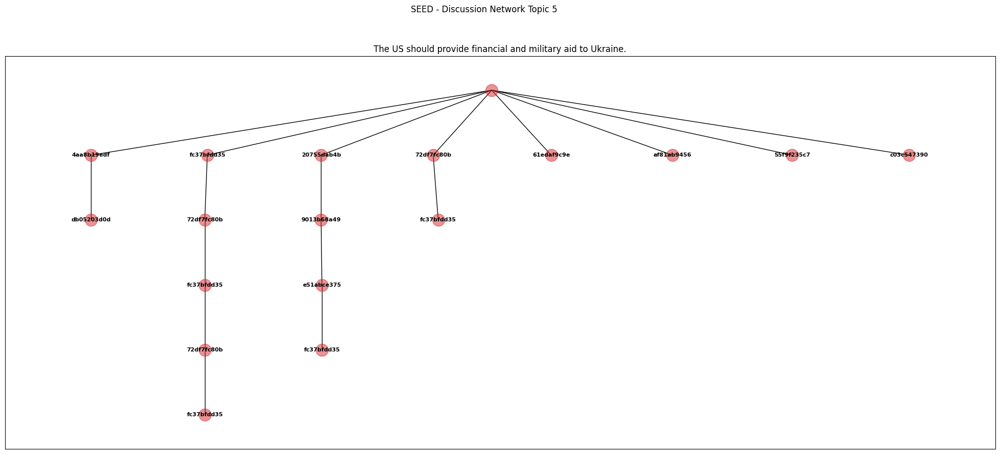

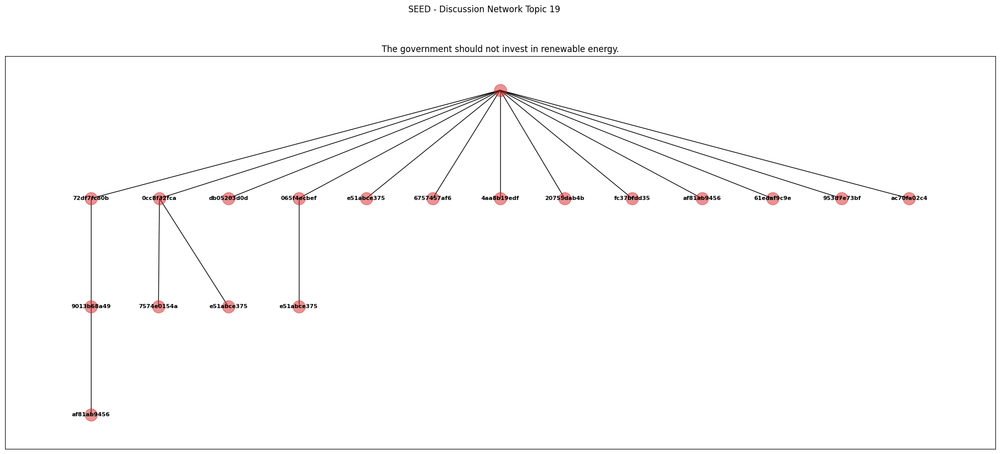

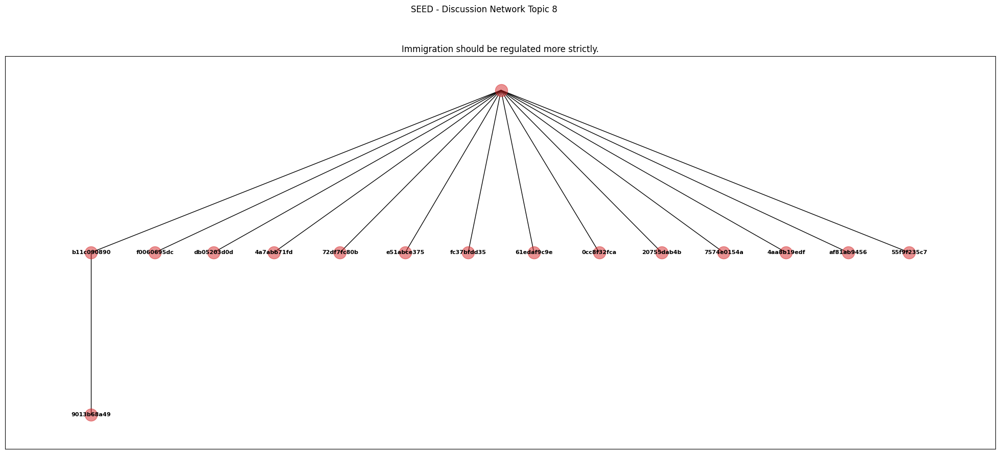

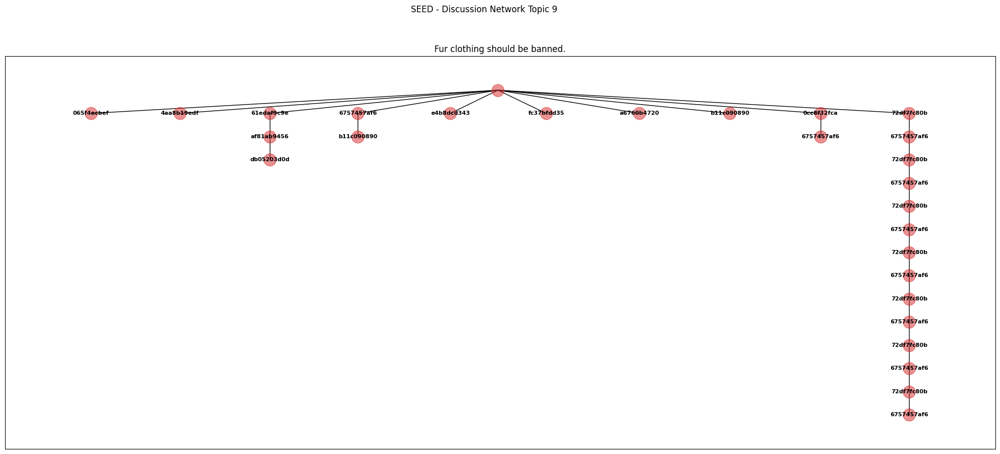

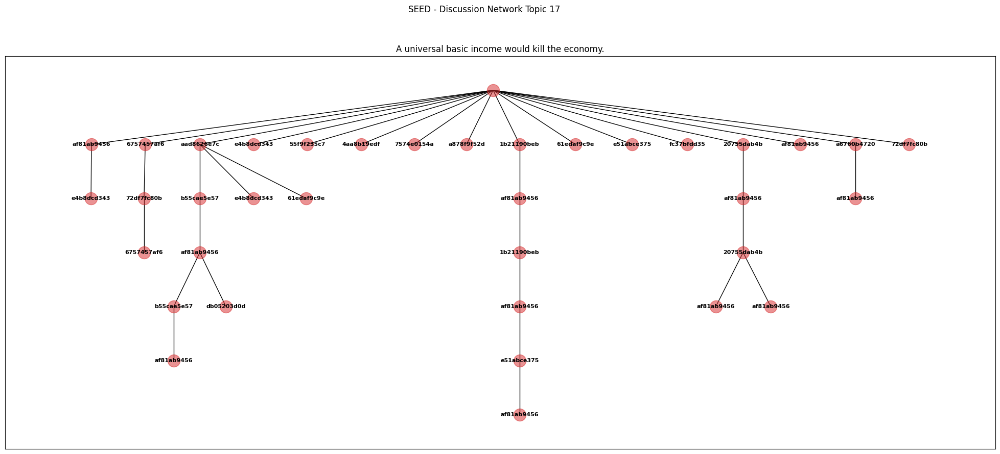

...

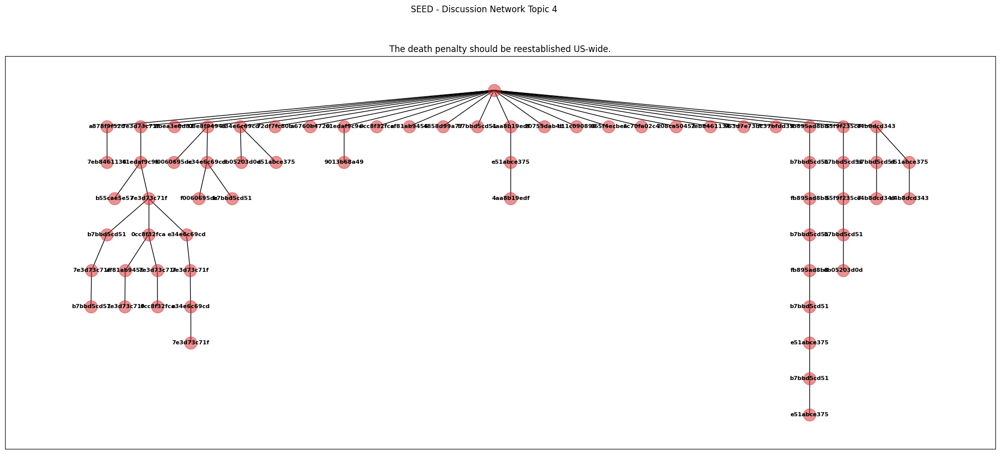

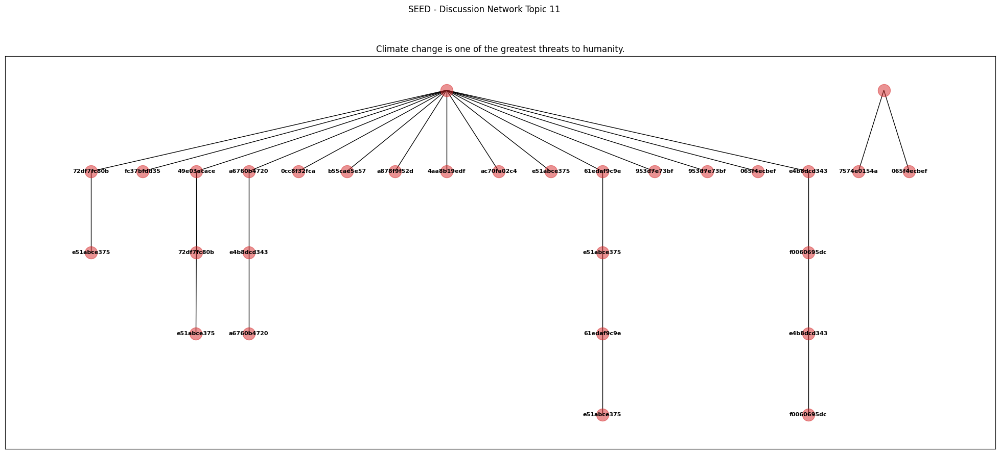

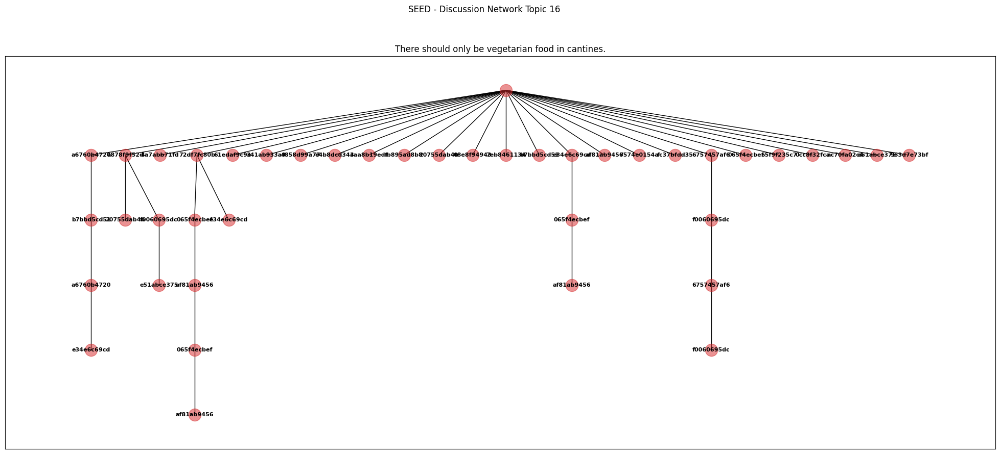

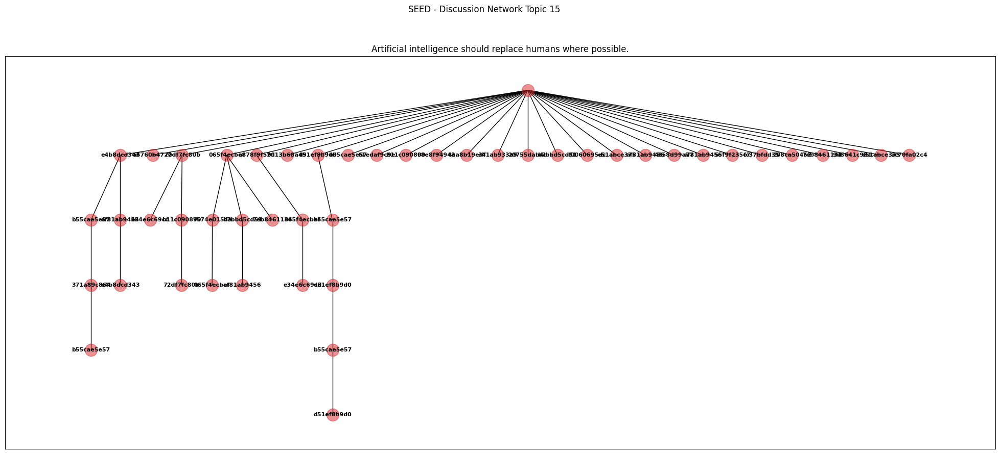

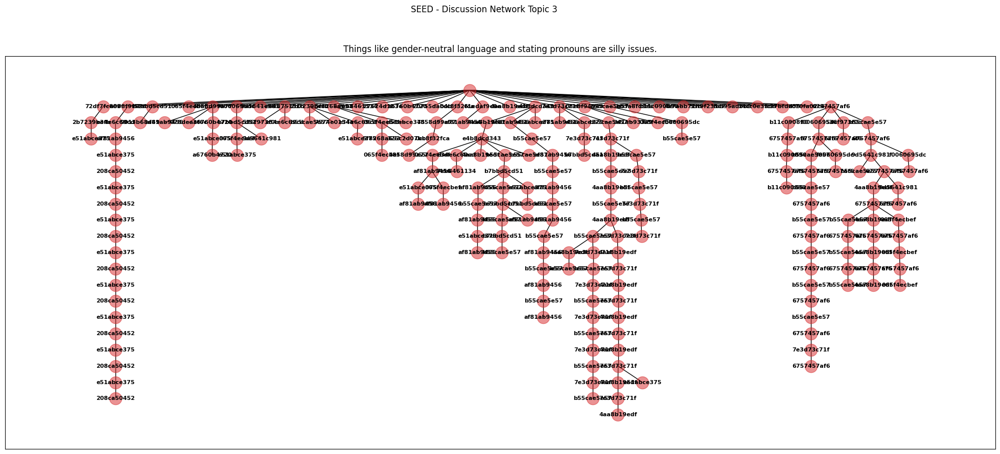

In [17]:
seed_network = {}
for i in simulated_conditions:
    temp = discussions_data[discussions_data["subreddit"] == i]
    seed_network[i] = visualize_thread_tree(temp, data_type="seed", plot=(True if i == 1 else False))

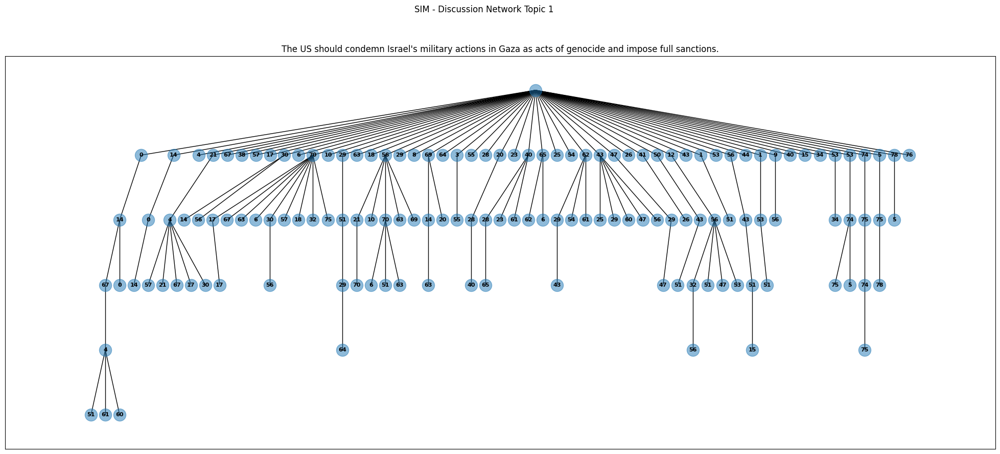

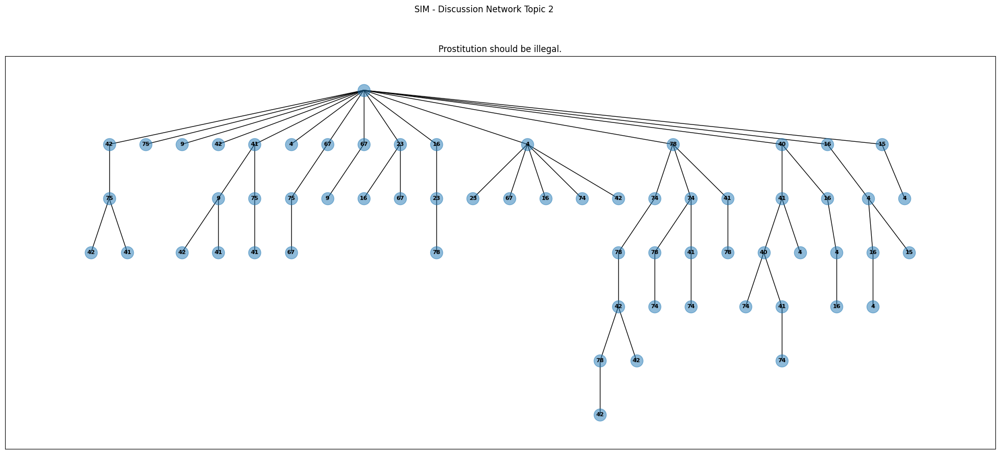

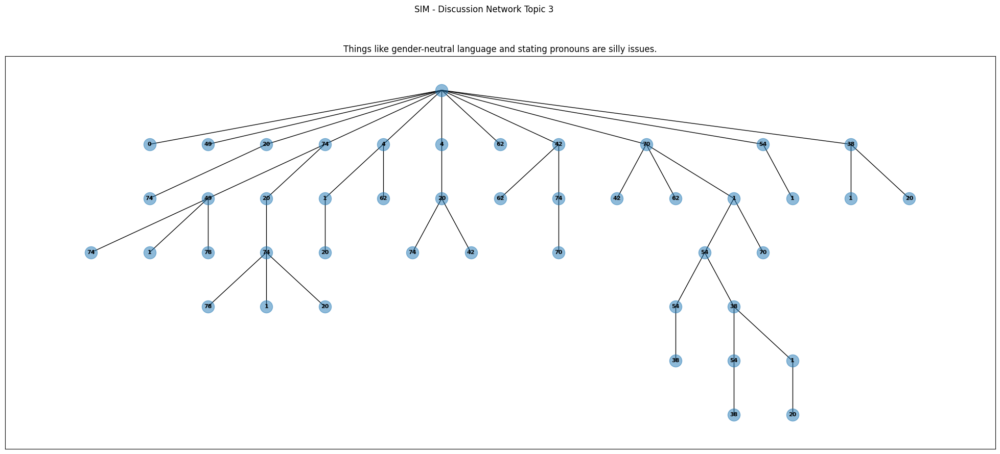

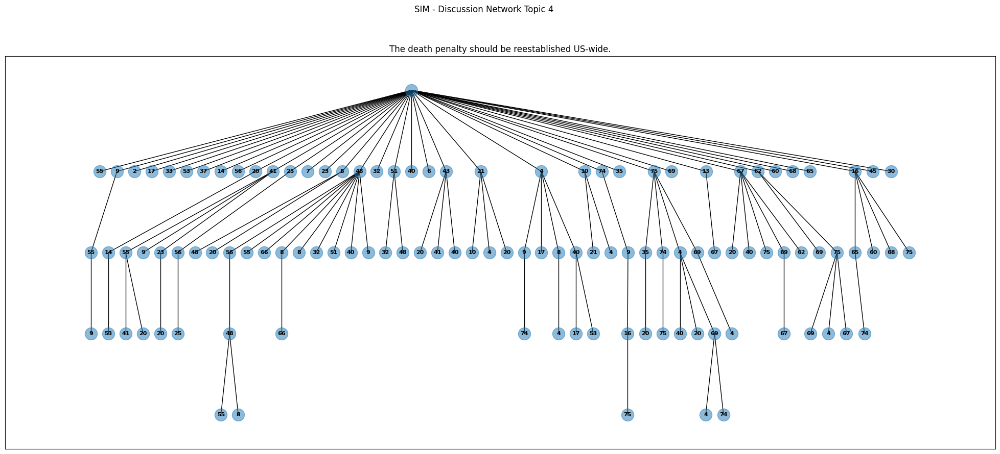

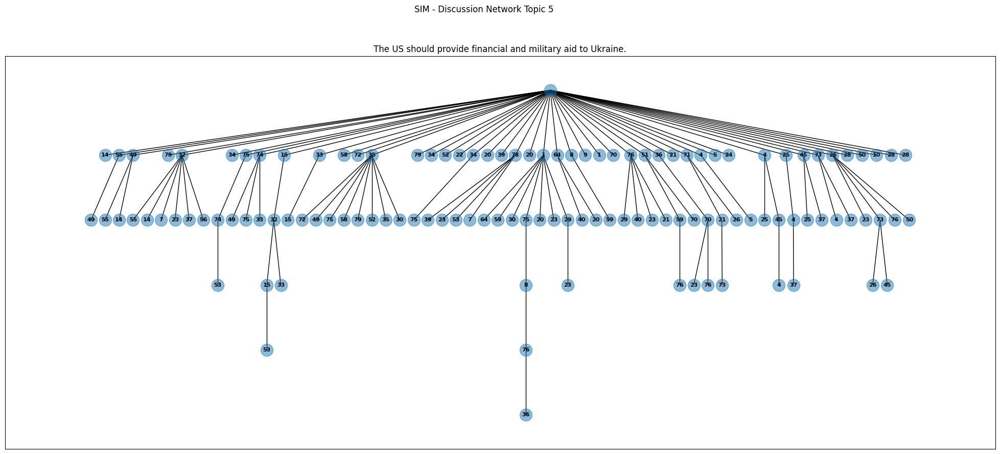

...

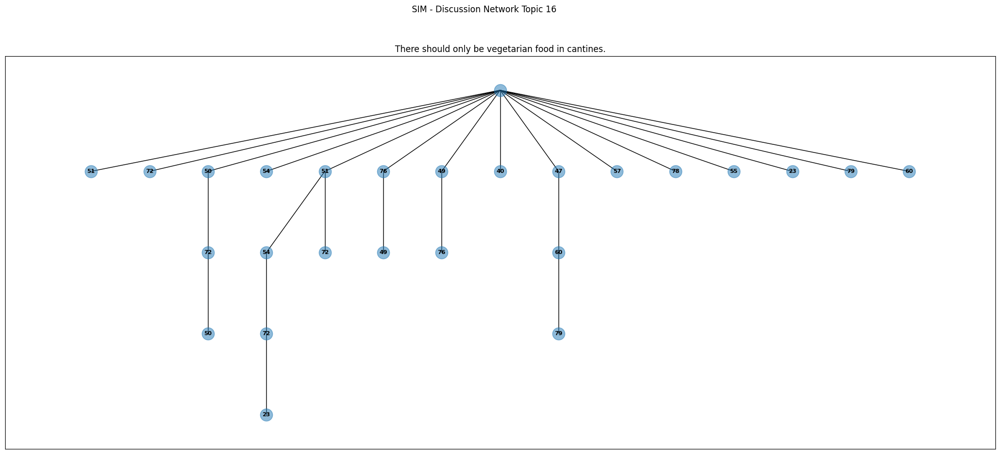

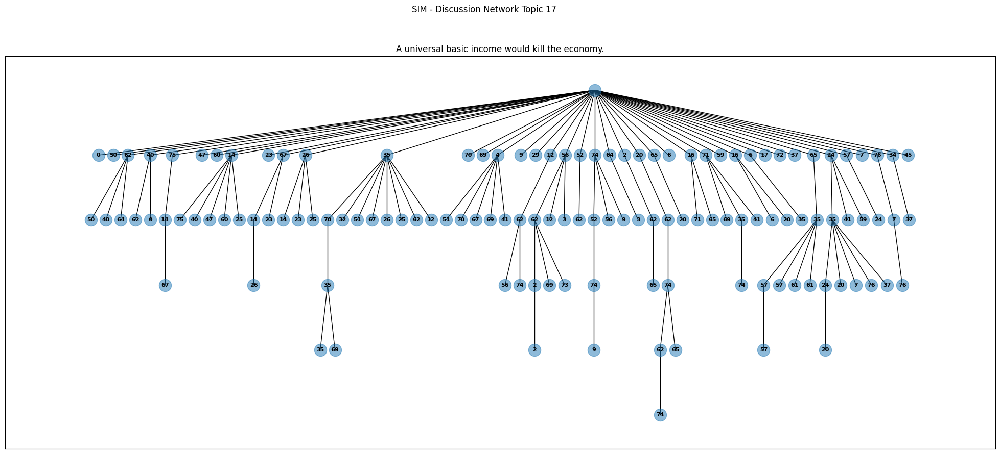

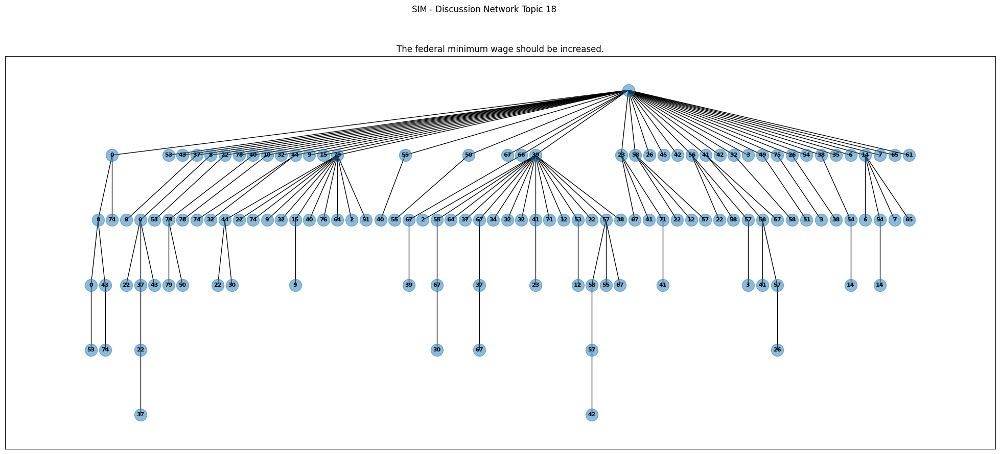

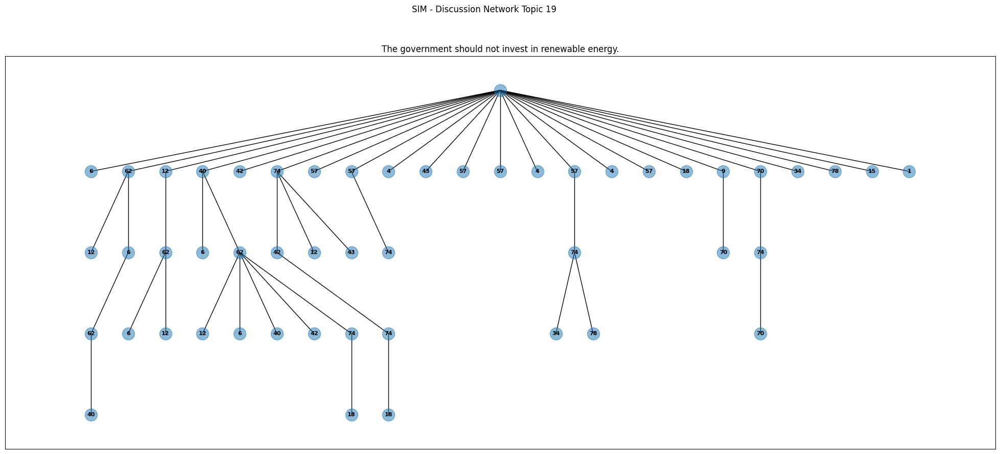

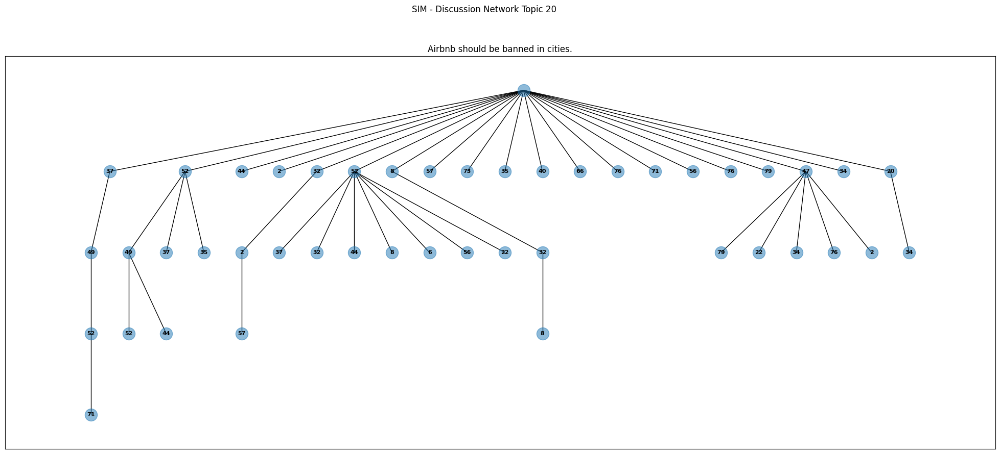

In [18]:
sim_network = []
k = 0
for r in sim_discussions_dfs:
    run_dict = {}
    for i in simulated_conditions:
        temp = r[r["subreddit"] == i]
        run_dict[i] = visualize_thread_tree(temp, data_type="sim", plot=(True if k == 0 else False))
        k += 1
    sim_network.append(run_dict)

In [19]:
for i in simulated_conditions:
    temp = [j for k in seed_network[i]["degrees"] for j in k]
    seed_avg_degree = round_mean(temp), get_ci(temp)
    seed_median_degree = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    temp = seed_network[i]["density"]
    seed_avg_density = round_mean(temp), get_ci(temp)
    seed_median_density = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = seed_network[i]["depth"]
    seed_avg_depth = round_mean(temp), get_ci(temp)
    seed_median_depth = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = seed_network[i]["width"]
    seed_avg_width = round_mean(temp), get_ci(temp)
    seed_median_width = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    user_sub_data = user_data[user_data["subreddit"] == i]
    seed_active_users = round(len(user_sub_data[user_sub_data["comment_count"] != 0]) / len(user_sub_data), 3)

    discussions_sub_data = discussions_data[discussions_data["subreddit"] == i]
    user_sub_data = user_data[user_data["subreddit"] == i]
    seed_scale_per_topic = discussions_sub_data.groupby("post_title")["ParticipantID"].nunique() 
    seed_n_users_per_sub = user_sub_data["ParticipantID"].nunique()
    seed_active_users_per_topic = np.array(seed_scale_per_topic) / seed_n_users_per_sub
    # seed_active_users_per_topic = seed_active_users_per_topic.reset_index()
    # seed_active_users_per_topic.columns = ["topic", "actives"]
    seed_avg_active_users_per_topic = round_mean(seed_active_users_per_topic), get_ci(seed_active_users_per_topic)
    seed_median_active_users_per_topic = round_mean(seed_active_users_per_topic, "median"), get_ci(seed_active_users_per_topic, "median")


    temp = [j for k in [r[i]["degrees"] for r in sim_network] for x in k for j in x]
    sim_avg_degree = round_mean(temp), get_ci(temp)
    sim_median_degree = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    sim_user_sub_data = [r[r["subreddit"] == i] for r in sim_user_dfs]
    temp = [round(len(r[r["sim_comment_count"] != 0]) / len(r), 3) for r in sim_user_sub_data]
    sim_active_users = round_mean(temp), get_ci(temp)

    temp = [j for k in [r[i]["density"] for r in sim_network] for j in k]
    sim_avg_density = round_mean(temp), get_ci(temp)
    sim_median_density = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = [j for k in [r[i]["depth"] for r in sim_network] for j in k]
    sim_avg_depth = round_mean(temp), get_ci(temp)
    sim_median_depth = round_mean(temp, mode="median"), get_ci(temp, mode="median")

    temp = [j for k in [r[i]["width"] for r in sim_network] for j in k]
    sim_avg_width = round_mean(temp), get_ci(temp)
    sim_median_width = round_mean(temp, mode="median"), get_ci(temp, mode="median")
    
    sim_discussions_sub_data = [r[r["subreddit"] == i] for r in sim_discussions_dfs]
    sim_user_sub_data = [r[r["subreddit"] == i] for r in sim_user_dfs]
    sim_scale_per_topic = [i.groupby("topic")["seed_user_id"].nunique() for i in sim_discussions_sub_data]
    sim_n_users_per_sub = sim_user_sub_data[0]["seed_user_id"].nunique()
    sim_active_users_per_topic = np.array(sim_scale_per_topic) / np.array(sim_n_users_per_sub)
    temp = [i for j in sim_active_users_per_topic for i in j]
    sim_avg_active_users_per_topic = round_mean(temp), get_ci(temp)
    sim_median_active_users_per_topic = round_mean(temp, "median"), get_ci(temp, "median")

    print("#"*80)
    print("{:^80}".format(f"Subreddit {i}"))
    print("#"*80)
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Tree Structure", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Degree:", seed_avg_degree[0], f"{seed_avg_degree[1]}", sim_avg_degree[0], f"{sim_avg_degree[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Degree:", seed_median_degree[0], f"{seed_median_degree[1]}", sim_median_degree[0], f"{sim_median_degree[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Density:", seed_avg_density[0], f"{seed_avg_density[1]}", sim_avg_density[0], f"{sim_avg_density[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Density:", seed_median_density[0], f"{seed_median_density[1]}", sim_median_density[0], f"{sim_median_density[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Depth:", seed_avg_depth[0], f"{seed_avg_depth[1]}", sim_avg_depth[0], f"{sim_avg_depth[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Depth:", seed_median_depth[0], f"{seed_median_depth[1]}", sim_median_depth[0], f"{sim_median_depth[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average Width:", seed_avg_width[0], f"{seed_avg_width[1]}", sim_avg_width[0], f"{sim_avg_width[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Width:", seed_median_width[0], f"{seed_median_width[1]}", sim_median_width[0], f"{sim_median_width[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("% Actives:", seed_active_users, f"", sim_active_users[0], f"{sim_active_users[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Average % Actives per Thread:", seed_avg_active_users_per_topic[0], f"{seed_avg_active_users_per_topic[1]}", sim_avg_active_users_per_topic[0], f"{sim_avg_active_users_per_topic[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median % Actives per Thread:", seed_median_active_users_per_topic[0], f"{seed_median_active_users_per_topic[1]}", sim_median_active_users_per_topic[0], f"{sim_median_active_users_per_topic[1]}"))

################################################################################
                                  Subreddit 1                                   
################################################################################
Tree Structure                   Seed   CI             |   Sim    CI             
Average Degree:                  1.96   (1.8, 2.12)    |   1.98   (1.93, 2.03)   
Median Degree:                   2.0    (1, 2)         |   1.0    (1, 1)         
Average Density:                 0.06   (0.04, 0.07)   |   0.03   (0.02, 0.03)   
Median Density:                  0.05   (0.04, 0.07)   |   0.02   (0.02, 0.02)   
Average Depth:                   7.5    (5.51, 9.49)   |   5.14   (4.95, 5.32)   
Median Depth:                    5.5    (5, 9)         |   5.0    (5, 5)         
Average Width:                  18.15   (15.63, 20.67) |  39.88   (37.35, 42.42) 
Median Width:                    17.5   (15, 20)       |   43.0   (40, 46)       
% Actives:         

In [20]:
# Visualize user_network

def visualize_user_network(subreddit_data, data_type, plot=True):
    if data_type == "seed":
        seed_post_id_col = "post_id"
        parent_id_col = "parent_id"
        user_id_col = "ParticipantID"
        topic_post_content_col = "post_title"
        unified_seed_post_id_col = "topic"
    elif data_type == "sim":
        seed_post_id_col = "topic"
        parent_id_col = "parent_comment_id"
        user_id_col = "user_id"
        topic_post_content_col = "topic_content"
        unified_seed_post_id_col = "topic"
    else:
        raise ValueError("Select either 'seed' or 'sim'.")

    network_metrics = {
        # "triangles_mean": [],
        # "triangles_median": [],
        "transitivity": [],
        "average_clustering": [],
        # "square_clustering": [],
        "n_communities": [],
        "edge_weights": [], 
        }

    thread_list = list(subreddit_data[topic_post_content_col].drop_duplicates())
    
    for i in thread_list:
        G = nx.Graph()
        temp = subreddit_data[subreddit_data[topic_post_content_col] == i]
        temp.set_index("comment_id", inplace=True)

        for j, r in temp.iterrows():
            if data_type == "sim":
                if r[parent_id_col] == -1:
                    source = 0
                else:
                    try:
                        source = temp.at[r[parent_id_col], user_id_col]
                    except:
                        source = -1
            else:
                if r[parent_id_col] == r[seed_post_id_col]:
                    source = 0
                else:
                    try:
                        source = temp.at[r[parent_id_col], user_id_col]
                    except:
                        source = -1

            target = r[user_id_col]

            # Increment the weight if the edge already exists
            if G.has_edge(source, target):
                G[source][target]["weight"] += 1
            else:
                G.add_edge(source, target, weight=1)

        # Use a layout algorithm that considers edge weights
        pos = nx.spring_layout(G, weight="weight", k=0.15, iterations=5000)

        # Compute communities using networkx.community.louvain_communities
        communities = nx.community.louvain_communities(G)
        community_dict = {}
        for idx, community in enumerate(communities):
            for node in community:
                community_dict[node] = idx

        node_colors = [community_dict[node] for node in G.nodes()]

        # network_metrics["triangles_mean"].append(np.mean(list(nx.triangles(G).values())))
        # network_metrics["triangles_median"].append(np.median(list(nx.triangles(G).values())))
        network_metrics["transitivity"].append(nx.transitivity(G))
        network_metrics["average_clustering"].append(nx.average_clustering(G))
        # network_metrics["square_clustering"].append(nx.square_clustering(G))
        network_metrics["n_communities"].append(len(communities))
        network_metrics["edge_weights"].append([G[u][v]["weight"] for u, v in G.edges()])

        if plot:
            fig, axs = plt.subplots(1, 1, figsize=(25, 10))
            # edges = nx.draw_networkx_edges(G, pos, width=[G[u][v]["weight"] for u, v in G.edges()])
            # nodes = nx.draw_networkx_nodes(G, pos, node_size=300, node_color=node_colors, cmap=plt.colormaps["PuBuGn" if data_type == "sim" else "YlOrRd"])

            nodes = nx.draw_networkx_nodes(
                G, pos, node_size=300,
                node_color=node_colors, cmap=plt.colormaps["viridis" if data_type == "sim" else "plasma"]
            )
            edges = nx.draw_networkx_edges(G, pos, width=[G[u][v]["weight"] for u, v in G.edges()])
            nx.draw_networkx_labels(
                G, pos,
                font_weight="bold", font_size=8
            )

            plt.suptitle(f"{data_type.upper()} - Tree Structure Topic {list(temp[unified_seed_post_id_col])[0]}")
            plt.title(f"{list(temp[topic_post_content_col])[0]}")
            if save_figs:
                plt.savefig(f"figures/{data_type}_networks/{data_type}_topic-{list(temp[unified_seed_post_id_col])[0]}_interaction_network.pdf")
            plt.show()

    return network_metrics

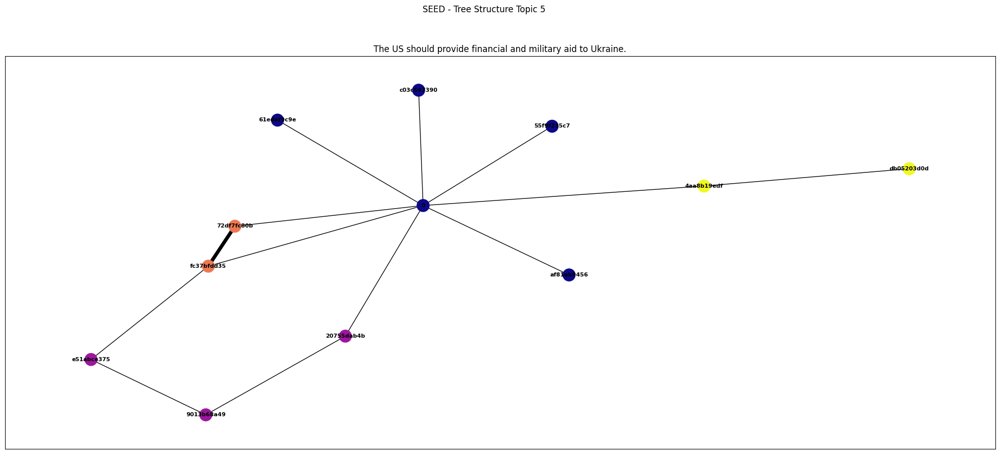

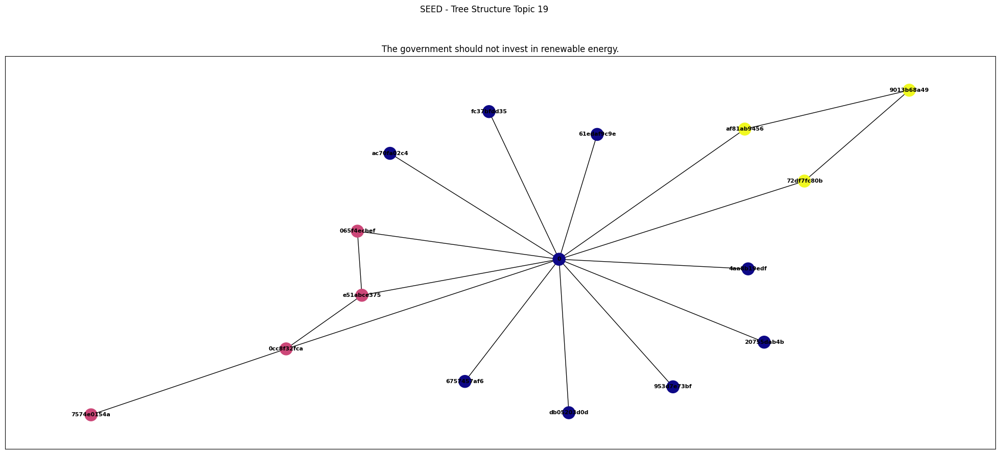

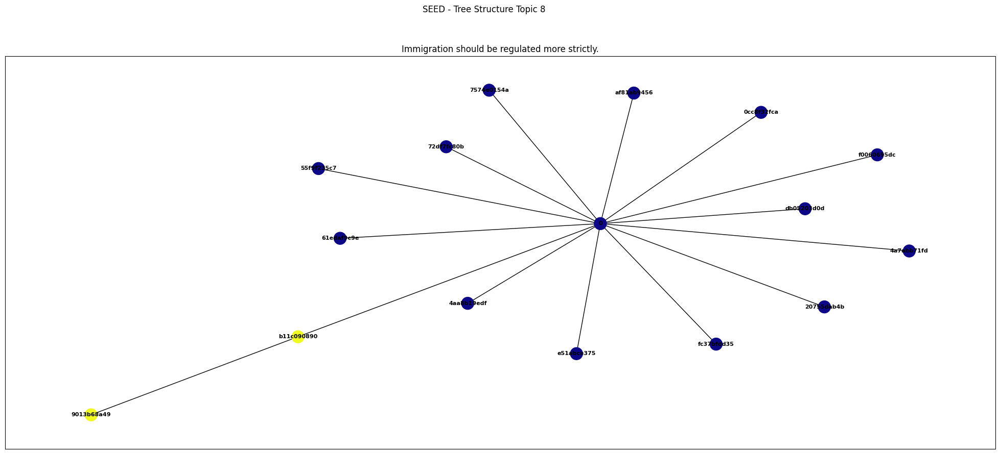

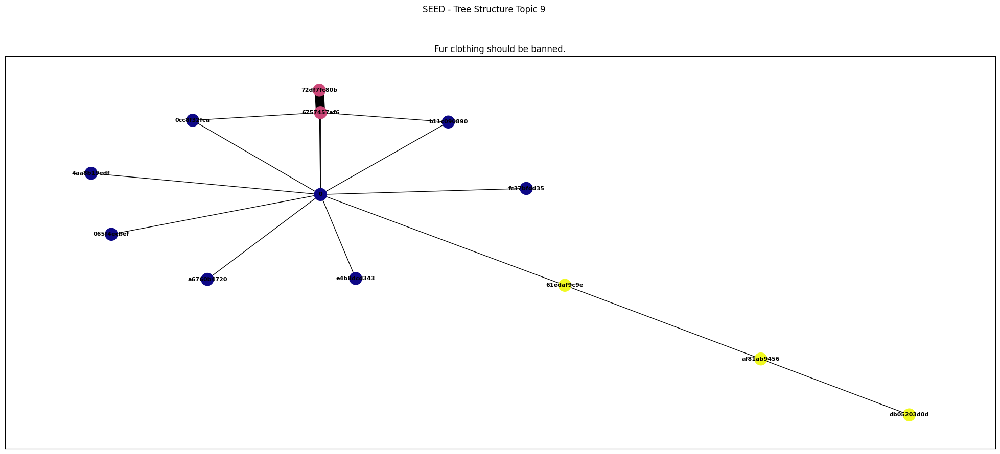

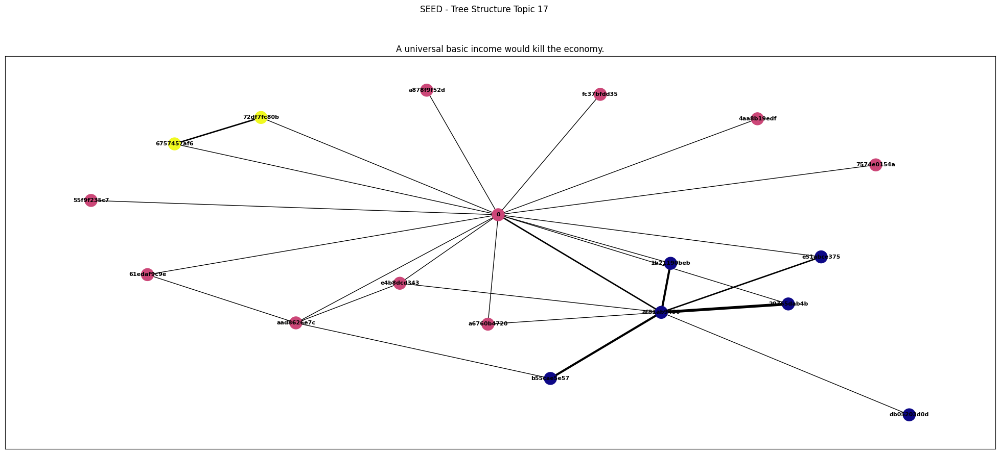

...

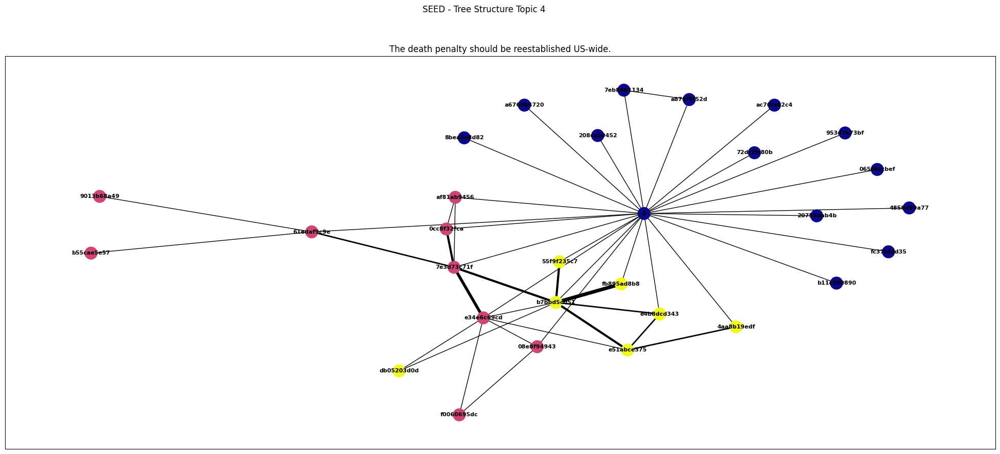

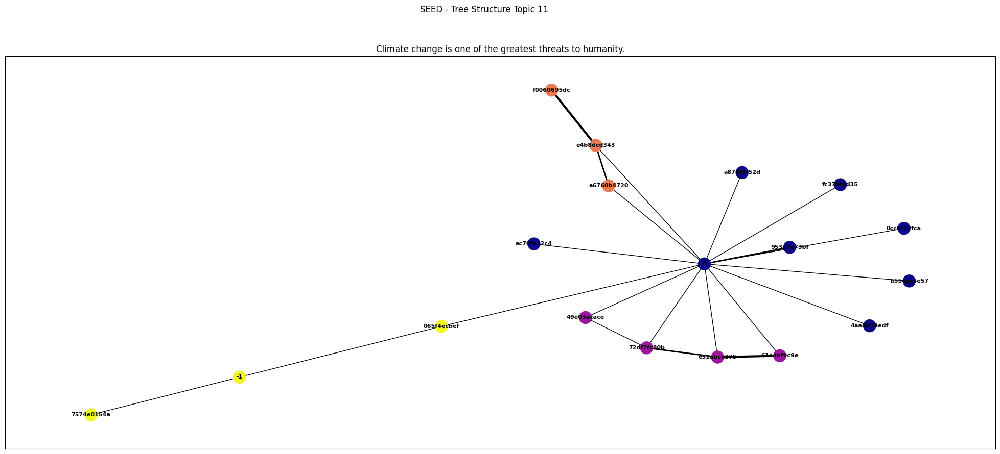

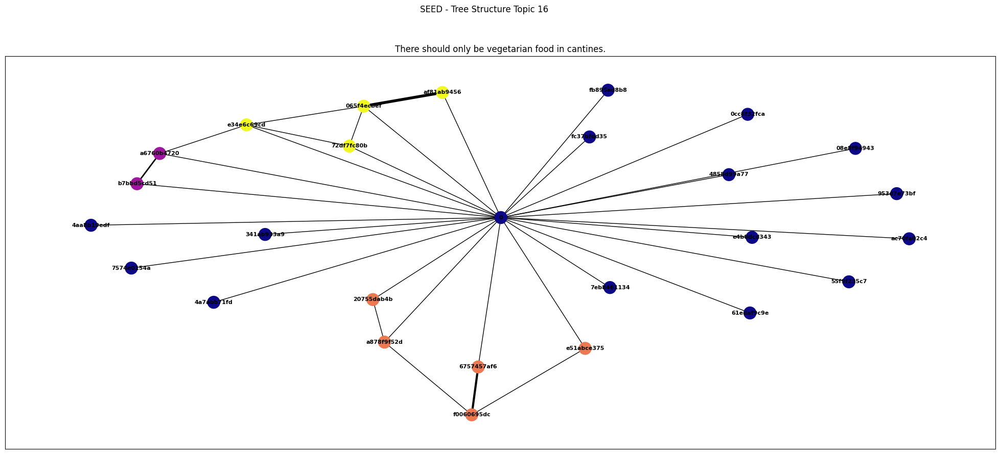

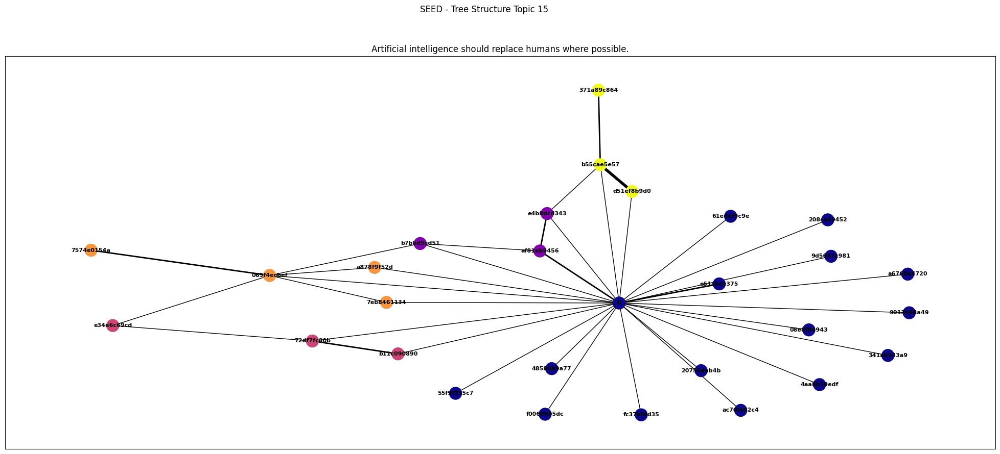

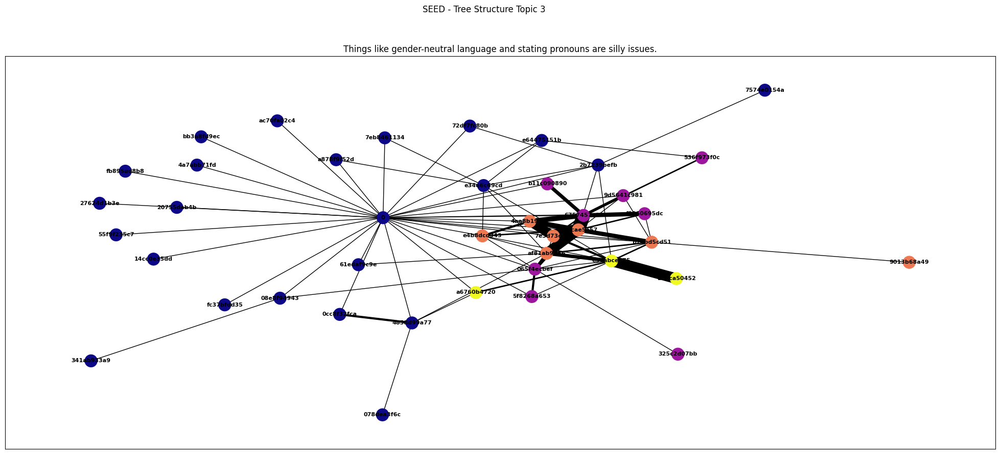

In [21]:
seed_communities = {}
for i in simulated_conditions:
    temp = discussions_data[discussions_data["subreddit"] == i]
    seed_communities[i] = visualize_user_network(temp, data_type="seed", plot=(True if i == 1 else False))

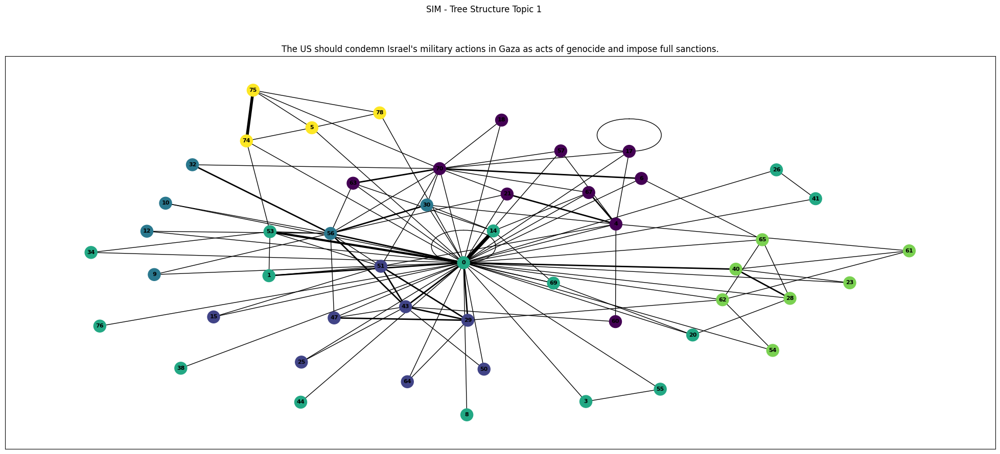

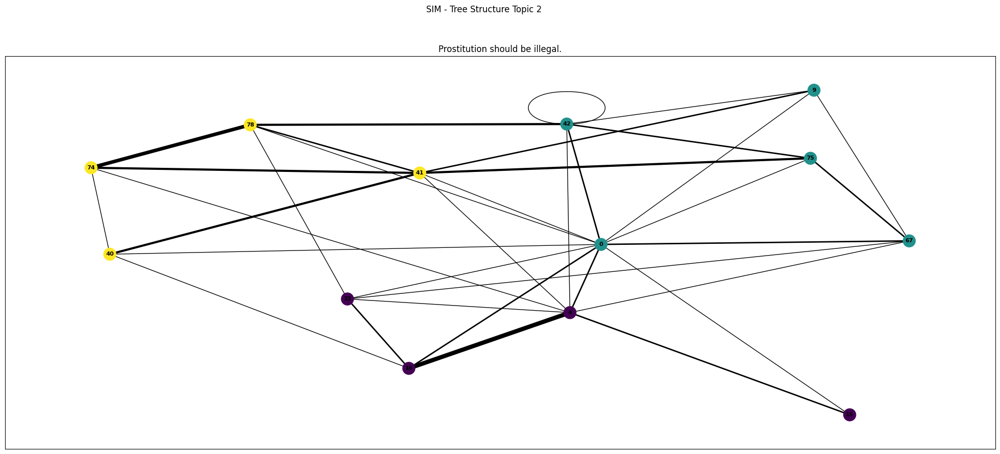

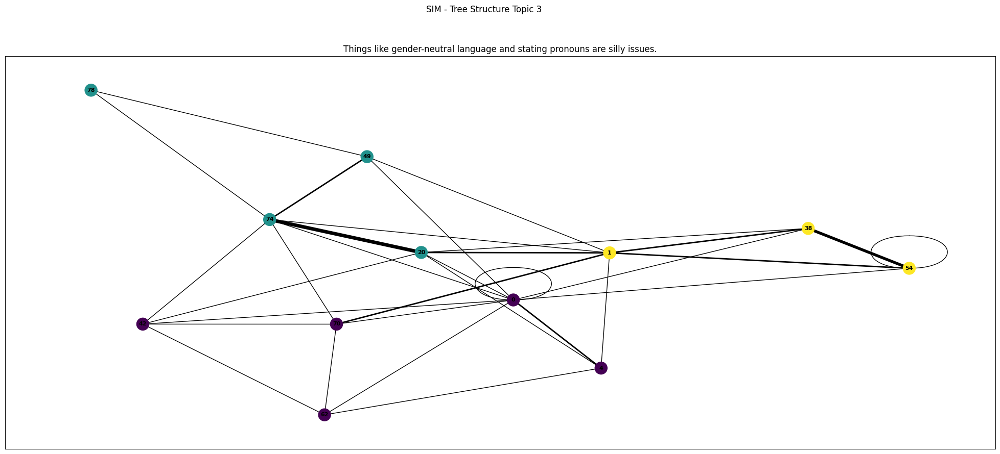

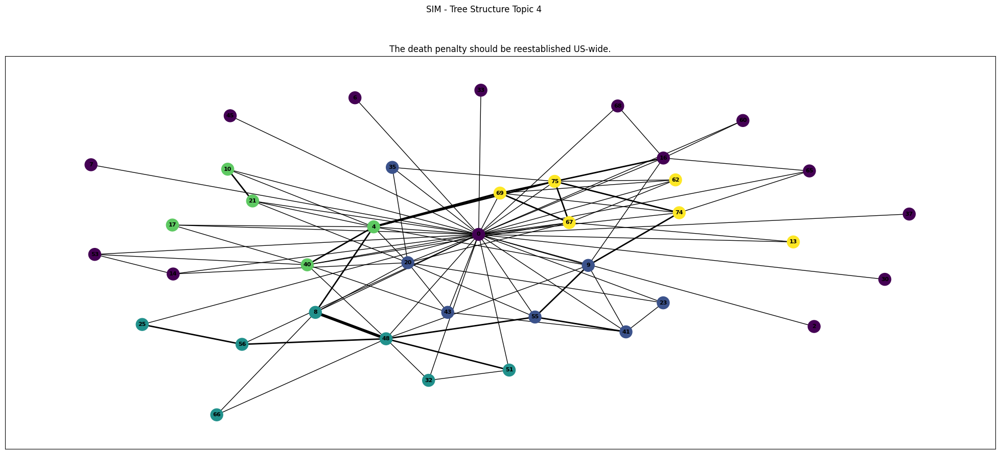

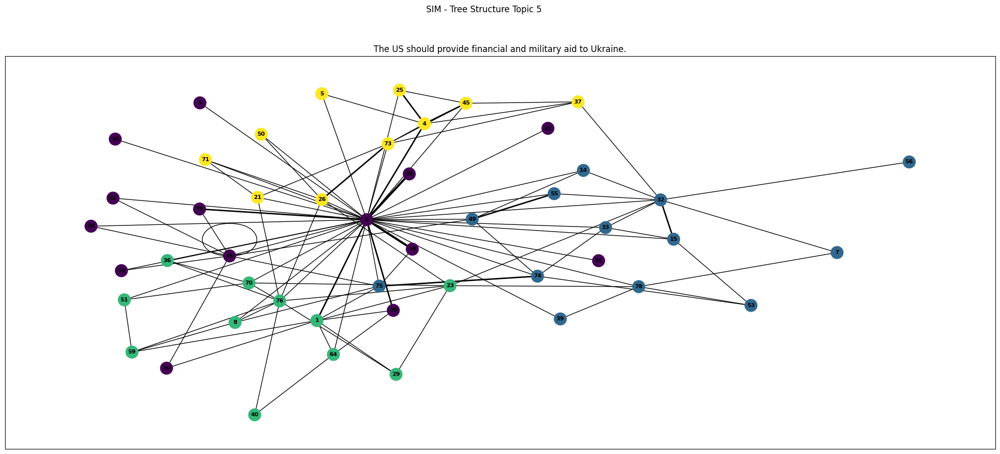

...

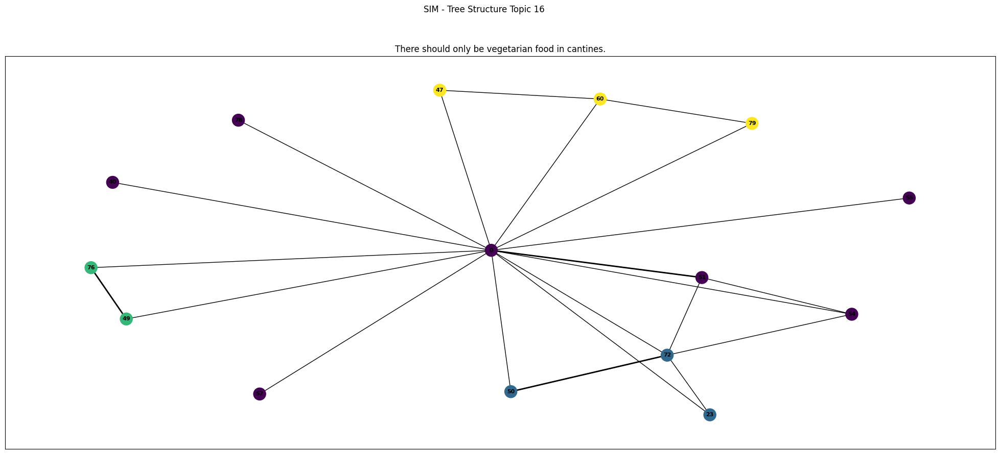

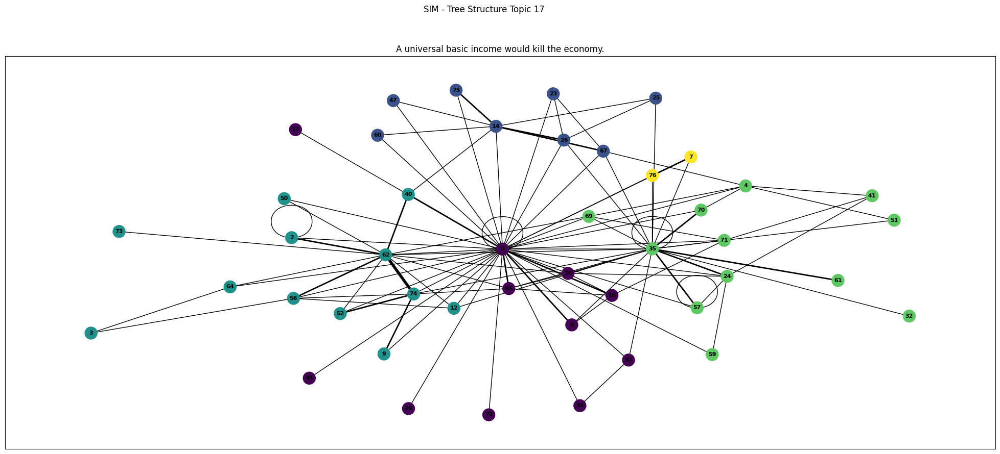

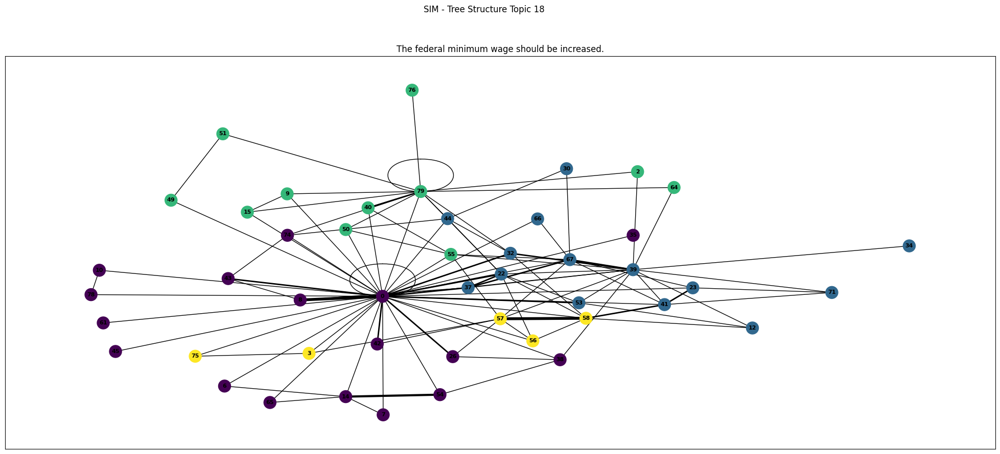

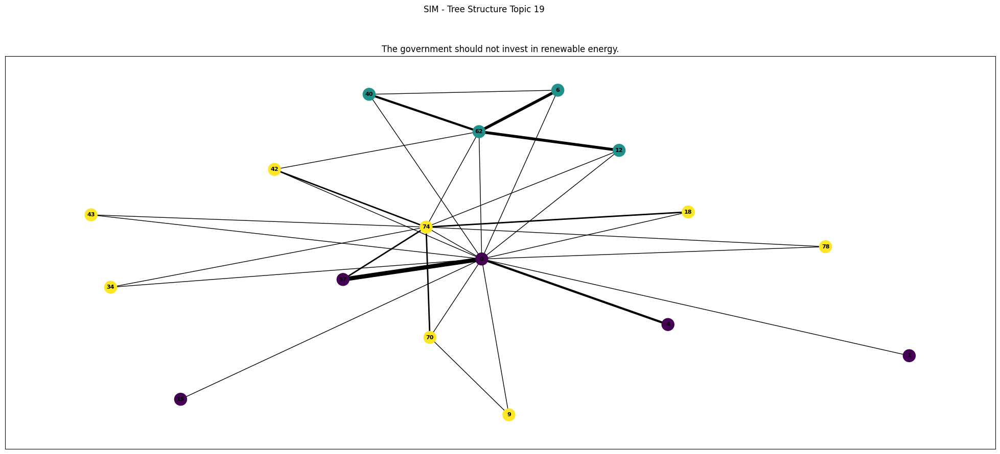

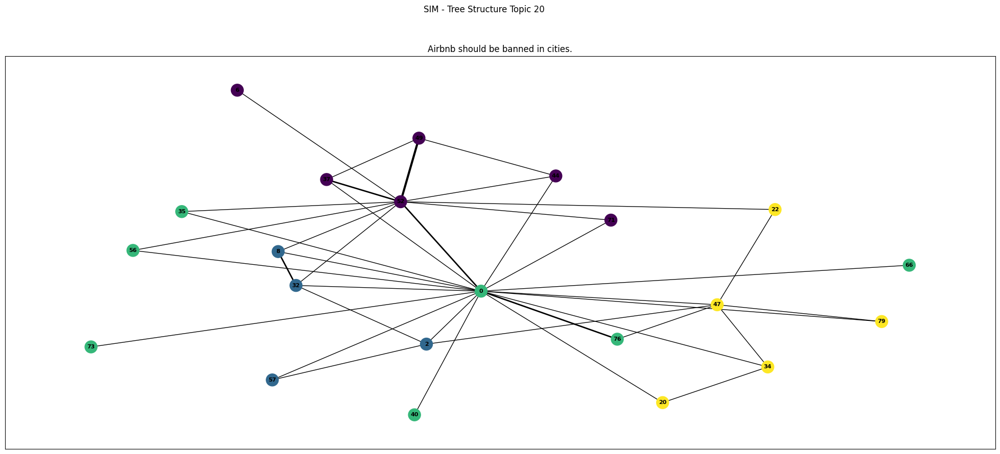

In [22]:
sim_communities = []
k = 0
for r in sim_discussions_dfs:
    run_dict = {}
    for i in simulated_conditions:
        temp = r[r["subreddit"] == i]
        run_dict[i] = visualize_user_network(temp, data_type="sim", plot=(True if k == 0 else False))
        k += 1
    sim_communities.append(run_dict)

In [23]:
# Summary of interaction network
for i in simulated_conditions:

    temp = seed_communities[i]["transitivity"]
    seed_mean_transitivity = round_mean(temp), get_ci(temp)
    seed_median_transitivity = round_mean(temp, "median"), get_ci(temp, "median")

    temp = seed_communities[i]["average_clustering"]
    seed_mean_clustering = round_mean(temp), get_ci(temp)
    seed_median_clustering = round_mean(temp, "median"), get_ci(temp, "median")

    temp = seed_communities[i]["n_communities"]
    seed_mean_n_communities = round_mean(temp), get_ci(temp)
    seed_median_n_communities = round_mean(temp, "median"), get_ci(temp, "median")

    # temp = [r[i]["transitivity"] for j in sim_communities for r in j]
    temp = [j for k in [r[i]["transitivity"] for r in sim_communities] for j in k]
    sim_mean_transitivity = round_mean(temp), get_ci(temp)
    sim_median_transitivity = round_mean(temp, "median"), get_ci(temp, "median")

    temp = [j for k in [r[i]["average_clustering"] for r in sim_communities] for j in k]
    sim_mean_clustering = round_mean(temp), get_ci(temp)
    sim_median_clustering = round_mean(temp, "median"), get_ci(temp, "median")

    temp = [j for k in [r[i]["n_communities"] for r in sim_communities] for j in k]
    sim_mean_n_communities = round_mean(temp), get_ci(temp)
    sim_median_n_communities = round_mean(temp, "median"), get_ci(temp, "median")
    
    print("#"*80)
    print("{:^80}".format(f"Subreddit {i}"))
    print("#"*80)
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean Transitivity", seed_mean_transitivity[0], f"{seed_mean_transitivity[1]}", sim_mean_transitivity[0], f"{sim_mean_transitivity[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Transitivity", seed_median_transitivity[0], f"{seed_median_transitivity[1]}", sim_median_transitivity[0], f"{sim_median_transitivity[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean Clustering", seed_mean_clustering[0], f"{seed_mean_clustering[1]}", sim_mean_clustering[0], f"{sim_mean_clustering[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median Clustering", seed_median_clustering[0], f"{seed_median_clustering[1]}", sim_median_clustering[0], f"{sim_median_clustering[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean N Communities", seed_mean_n_communities[0], f"{seed_mean_n_communities[1]}", sim_mean_n_communities[0], f"{sim_mean_n_communities[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median N Communities", seed_median_n_communities[0], f"{seed_median_n_communities[1]}", sim_median_n_communities[0], f"{sim_median_n_communities[1]}"))

################################################################################
                                  Subreddit 1                                   
################################################################################
Interaction Network              Seed   CI             |   Sim    CI             
Mean Transitivity                0.12   (0.09, 0.15)   |   0.29   (0.27, 0.31)   
Median Transitivity              0.11   (0.07, 0.16)   |   0.23   (0.22, 0.26)   
Mean Clustering                  0.23   (0.17, 0.29)   |   0.56   (0.54, 0.57)   
Median Clustering                0.24   (0.16, 0.3)    |   0.54   (0.52, 0.56)   
Mean N Communities               3.6    (3.21, 3.99)   |   4.39   (4.23, 4.55)   
Median N Communities             3.5    (3, 4)         |   4.0    (4, 5)         
################################################################################
                                  Subreddit 6                                   
#####################

In [24]:
seed_weights = []
sim_weights = []

for i in simulated_conditions:
    [seed_weights.extend(j) for j in seed_communities[i]["edge_weights"]]

for i in simulated_conditions:
    [sim_weights.extend(j) for j in [r[i]["edge_weights"] for r in sim_communities]]

In [25]:
def plot_multirun_hist_a(x, ax, bins=20, density=None):
    distributions = [i for i in x]

    bins, bin_width = np.linspace(0, max([max(i) for i in distributions]) + 1, bins + 1, retstep=True)

    histograms = [np.histogram(dist, bins=bins, density=density)[0] for dist in distributions]
    histograms = np.array(histograms)

    mean_histogram = np.mean(histograms, axis=0)

    confidence_intervals = 1.96 * np.std(histograms, axis=0) / np.sqrt(len(distributions))

    bin_centers = (bins[:-1] + bins[1:]) / 2
    
    ax.bar(bin_centers, mean_histogram, width=np.diff(bins), yerr=confidence_intervals, capsize=4, label="Sim")
    ax.set_ylim(0)
    ax.set_xlim(0)

    return ax, bin_width

In [26]:
def plot_multirun_hist_b(x, data=None, ax=None, bins=20, density=False):
    if data == None:
        distributions = [i[x] for i in sim_discussions_dfs]
    else:
        distributions = [i[x] for i in data]

    bins, width = np.linspace(0, max([max(i) for i in distributions]) + 1, bins + 1, retstep=True)

    histograms = [np.histogram(dist, bins=bins, density=density)[0] for dist in distributions]
    histograms = np.array(histograms)

    mean_histogram = np.mean(histograms, axis=0)

    confidence_intervals = 1.96 * np.std(histograms, axis=0) / np.sqrt(len(distributions))

    bin_centers = (bins[:-1] + bins[1:]) / 2

    if ax == None:
        fig, ax = plt.subplots(1, 1)
    
    ax.bar(bin_centers, mean_histogram, width=np.diff(bins), yerr=confidence_intervals, capsize=4, label="Sim")
    ax.set_ylim(0)

    return ax, width

In [27]:
def binner(x, width):
    bins = [0]
    i = 1
    while bins[-1] < np.max(x):
        bins.extend([width * i])
        i += 1
    return bins

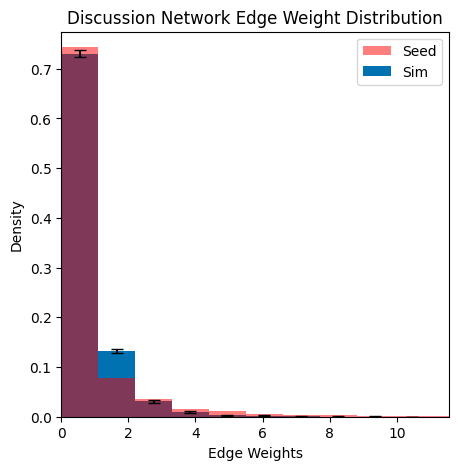

In [28]:
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

# ax.hist(sim_weights, density=True, label="Sim")
ax, bw = plot_multirun_hist_a(sim_weights, ax=ax, density=True, bins=10)
ax.hist(seed_weights, density=True, bins=binner(seed_weights, bw), color="r", alpha=0.5, label="Seed")

ax.set_xlim(0)
ax.set_xlabel("Edge Weights")
ax.set_ylabel("Density")
ax.set_title("Discussion Network Edge Weight Distribution")


# ax.set_xticks(range(20))
ax.legend()
if save_figs:
    plt.savefig("figures/seed-sim_dist_edge-weights.pdf")
plt.show()

In [29]:
def get_n_replies(data, data_type):
    if data_type == "seed":
        parent_id_col = "parent_id"
        user_id_col = "ParticipantID"
        comment_id_col = "comment_id"
        topic_id_col = "post_id"
        post_ids = list(data[topic_id_col].unique())
    elif data_type == "sim":
        parent_id_col = "parent_comment_id"
        user_id_col = "user_id"
        comment_id_col = "comment_id"
        topic_id_col = "post_id"
        post_ids = [-1]
    else:
        raise ValueError("Enter valid data type")
    
    temp = data.set_index(comment_id_col)
    
    replies = 0
    n_missing_links = 0
    
    for i, r in temp.iterrows():
    
        try:
            if r[parent_id_col] not in post_ids:
                parent = r[parent_id_col]
                user = r[user_id_col]
        
                if temp.at[parent, user_id_col] != user:
                    sup_parent = temp.at[parent, parent_id_col]
        
                    if sup_parent not in post_ids:
                        if temp.at[sup_parent, user_id_col] == user:
                            replies += 1
        except:
            n_missing_links += 1
    
    return replies, n_missing_links

In [30]:
seed_n_replies = []
seed_n_missing_links = []

for i in simulated_conditions:
    sub_temp = discussions_data[discussions_data["subreddit"] == i].sort_values("topic")
    topics = list(discussions_data["topic"].unique())
    topics.sort()
    for j in topics:
        topic_temp = sub_temp[sub_temp["topic"] == j]
        topic_data = get_n_replies(topic_temp, "seed")

        # print(topic_data)
        seed_n_replies.append(topic_data[0])
        seed_n_missing_links.append(topic_data[1])

In [31]:
sim_n_replies = []
sim_n_missing_links = []

for i in simulated_conditions:
    sub_temp = [r[r["subreddit"] == i].sort_values("topic") for r in sim_discussions_dfs]
    topics = list(sim_discussions_data["topic"].unique())
    topics.sort()
    for j in topics:
        topic_temp = [r[r["topic"] == j] for r in sub_temp]
        topic_data = [get_n_replies(r, "sim") for r in topic_temp]

        # print(topic_data)
        [sim_n_replies.append(r[0]) for r in topic_data]
        [sim_n_missing_links.append(r[1]) for r in topic_data]

In [32]:
# Summary of reply patterns

seed_mean_n_replies = round_mean(seed_n_replies), get_ci(seed_n_replies)
seed_median_n_replies = round_mean(seed_n_replies, "median"), get_ci(seed_n_replies, "median")

sim_mean_n_replies = round_mean(sim_n_replies), get_ci(sim_n_replies)
sim_median_n_replies = round_mean(sim_n_replies, "median"), get_ci(sim_n_replies, "median")

print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean N Replies", seed_mean_n_replies[0], f"{seed_mean_n_replies[1]}", sim_mean_n_replies[0], f"{sim_mean_n_replies[1]}"))
print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median N Replies", seed_median_n_replies[0], f"{seed_median_n_replies[1]}", sim_median_n_replies[0], f"{sim_median_n_replies[1]}"))

for i, j in zip(range(len(simulated_conditions)), simulated_conditions):

    bounds = list(range(0, len(seed_n_replies)+1, 20))
    temp = seed_n_replies[bounds[i]:bounds[i+1]]
    seed_mean_n_replies_sub = round_mean(temp), get_ci(temp)
    seed_median_n_replies_sub = round_mean(temp, "median"), get_ci(temp, "median")
    
    bounds = list(range(0, len(sim_n_replies)+1, 20))
    temp = [j for k in [sim_n_replies[bounds[i+r]:bounds[i+1+r]] for r in range(0, 5)] for j in k]
    sim_mean_n_replies_sub = round_mean(temp), get_ci(temp)
    sim_median_n_replies_sub = round_mean(temp, "median"), get_ci(temp, "median")

    print("#"*80)
    print("{:^80}".format(f"Subreddit {j}"))
    print("#"*80)
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Interaction Network", "Seed", "CI", "Sim", "CI"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Mean N Replies", seed_mean_n_replies_sub[0], f"{seed_mean_n_replies_sub[1]}", sim_mean_n_replies_sub[0], f"{sim_mean_n_replies_sub[1]}"))
    print("{:<30}{:^10}{:<15}|{:^10}{:<15}".format("Median N Replies", seed_median_n_replies_sub[0], f"{seed_median_n_replies_sub[1]}", sim_median_n_replies_sub[0], f"{sim_median_n_replies_sub[1]}"))

Interaction Network              Seed   CI             |   Sim    CI             
Mean N Replies                  14.15   (7.96, 20.34)  |   5.6    (5.35, 5.86)   
Median N Replies                 8.0    (5, 13)        |   6.0    (5, 6)         
################################################################################
                                  Subreddit 1                                   
################################################################################
Interaction Network              Seed   CI             |   Sim    CI             
Mean N Replies                  16.45   (4.75, 28.15)  |   5.93   (5.38, 6.48)   
Median N Replies                 6.0    (5, 17)        |   6.0    (5, 6)         
################################################################################
                                  Subreddit 6                                   
################################################################################
Interaction Network   

In [34]:
# Reply statistics per topic for empirical and simulated data
sim_replies_per_topic = []
for i in range(0, 20):
    t = sim_n_replies[i*10:(i+1)*10]
    u = sim_n_replies[i*10+200:(i+1)*10+200]
    sim_replies_per_topic.append([i+j for i, j in zip(t, u)])

sim_replies_per_topic_avg = [round_mean(i) for i in sim_replies_per_topic]
sim_replies_per_topic_ci = [get_ci(i) for i in sim_replies_per_topic]

seed_replies_per_topic = []
for i in range(0, 20):
    t = [seed_n_replies[i*1]]
    u = [seed_n_replies[i*1+10]]
    seed_replies_per_topic.extend(i+j for i,j in zip(t, u))

temp = scipy.stats.pearsonr(seed_replies_per_topic, sim_replies_per_topic_avg)
print(f"Correlation: Empirical/simulated replies per topic: {temp[0]} (p={temp[1]})")
print()

for i in range(20):
    topic = discussions_data[discussions_data["topic"] == i+1]["post_title"].iloc[0]
    print("{:<110}{:^10}{:^10}{:<20}".format(topic, seed_replies_per_topic[i], sim_replies_per_topic_avg[i], f"{sim_replies_per_topic_ci[i]}"))

print()
temp = scipy.stats.pearsonr(seed_replies_per_topic, seed_volume_per_topic)
print(f"Correlation: Volume/replies per topic (empirical): {temp[0]} (p={temp[1]})")
temp = scipy.stats.pearsonr(sim_replies_per_topic_avg, [round_mean(i) for i in sim_volume_per_topic])
print(f"Correlation: Volume/replies per topic (simulation): {temp[0]} (p={temp[1]})")

Correlation: Empirical/simulated replies per topic: 0.32523435381884613 (p=0.16174600175676004)

The US should condemn Israel's military actions in Gaza as acts of genocide and impose full sanctions.            25       11.1   (9.44, 12.76)       
Prostitution should be illegal.                                                                                   18       14.1   (11.29, 16.91)      
Things like gender-neutral language and stating pronouns are silly issues.                                       122       14.5   (10.93, 18.07)      
The death penalty should be reestablished US-wide.                                                                66       12.8   (10.5, 15.1)        
The US should provide financial and military aid to Ukraine.                                                      10       9.8    (7.76, 11.84)       
We need stricter gun control laws.                                                                                43       9.3    (7.07, 11.53)     

In [35]:
seed_x = []
seed_y = []

temp = discussions_data.set_index("comment_id")

for i, r in temp.iterrows():
    if r["parent_id"] in temp.index:
        seed_x.append(r["length_comment_char"])
        seed_y.append(temp.at[r["parent_id"], "length_comment_char"])

In [36]:
sim_x = []
sim_y = []

for run in sim_discussions_dfs:
    run_x = []
    run_y = []
    for i in simulated_conditions:
        for j in range(1, 21):
    
            temp = run[run["subreddit"] == i]
            temp = temp[temp["topic"] == j]
            temp = temp.set_index("comment_id")
            
            for x, r in temp.iterrows():
                if r["parent_comment_id"] in temp.index:
                    run_x.append(r["sim_comment_length"])
                    run_y.append(temp.at[r["parent_comment_id"], "sim_comment_length"])
    sim_x.append(run_x)
    sim_y.append(run_y)

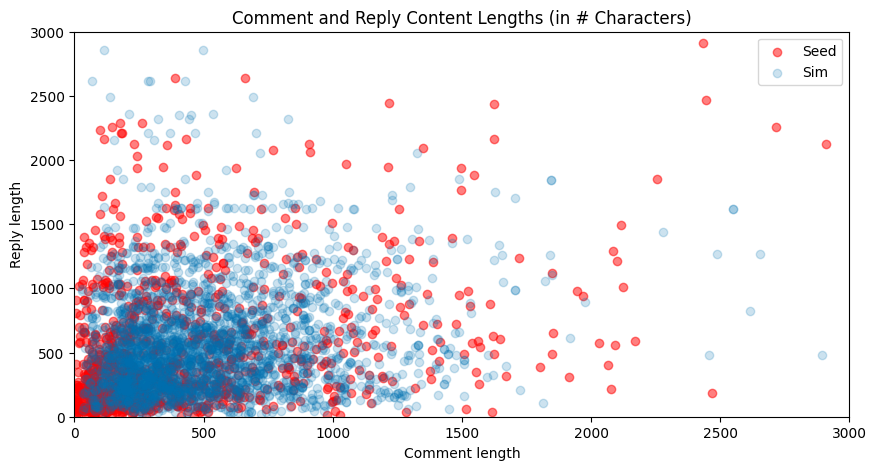

In [37]:
fig, ax = plt.subplots(1, 1, figsize=figsize_wide)

ax.scatter(seed_x, seed_y, alpha=0.5, color="r", label="Seed")
ax.scatter(sim_x[0], sim_y[0], alpha=0.2, label="Sim")

# ax[0].scatter(sim_x[0], sim_y[0], alpha=0.5, label="Sim")
# ax[1].scatter(seed_x, seed_y, alpha=0.2, color="r", label="Seed")

# ax[0].set_xlim(-200, 4000)
# ax[0].set_ylim(-250, 5500)
ax.set_xlim(0, 3000)
ax.set_ylim(0, 3000)
ax.set_xlabel("Comment length")
ax.set_ylabel("Reply length")
ax.set_title("Comment and Reply Content Lengths (in # Characters)")

ax.legend()
if save_figs:
    plt.savefig("figures/seed-sim_scatter_parent-reply-comment-length.pdf")
plt.show()

In [38]:
seed_parent_reply_length_corr = scipy.stats.pearsonr(seed_x, seed_y)

sim_parent_reply_length_corr = [[], []]
for i in range(len(sim_discussions_dfs)):
    temp = scipy.stats.pearsonr(sim_x[i], sim_y[i])
    sim_parent_reply_length_corr[0].append(temp[0])
    sim_parent_reply_length_corr[1].append(temp[1])

seed_r = round(seed_parent_reply_length_corr[0], 3)
seed_p = round(seed_parent_reply_length_corr[1], 3)

sim_r = round_mean(sim_parent_reply_length_corr[0]), get_ci(sim_parent_reply_length_corr[0])
sim_p = round_mean(sim_parent_reply_length_corr[1]), get_ci(sim_parent_reply_length_corr[1])

print("-"*80)
print("{:<30}{:^10}|{:^40}".format("Parent-Reply Length", "Seed", "Sim"))
print("-"*80)
print("{:<30}{:^5}{:^5}|{:^5}{:^15}{:^5}{:^15}".format("", "Coef", "p", "Coef", "CI", "p", "CI"))
print("{:<30}{:^5}{:^5}|{:^5}{:^15}{:^5}{:^15}".format("Pearson r", seed_r, seed_p, sim_r[0], f"{sim_r[1]}", sim_p[0], f"{sim_p[1]}"))

--------------------------------------------------------------------------------
Parent-Reply Length              Seed   |                  Sim                   
--------------------------------------------------------------------------------
                              Coef   p  |Coef       CI         p        CI       
Pearson r                     0.331 0.0 |0.19  (0.17, 0.22)   0.0   (-0.0, 0.0)  


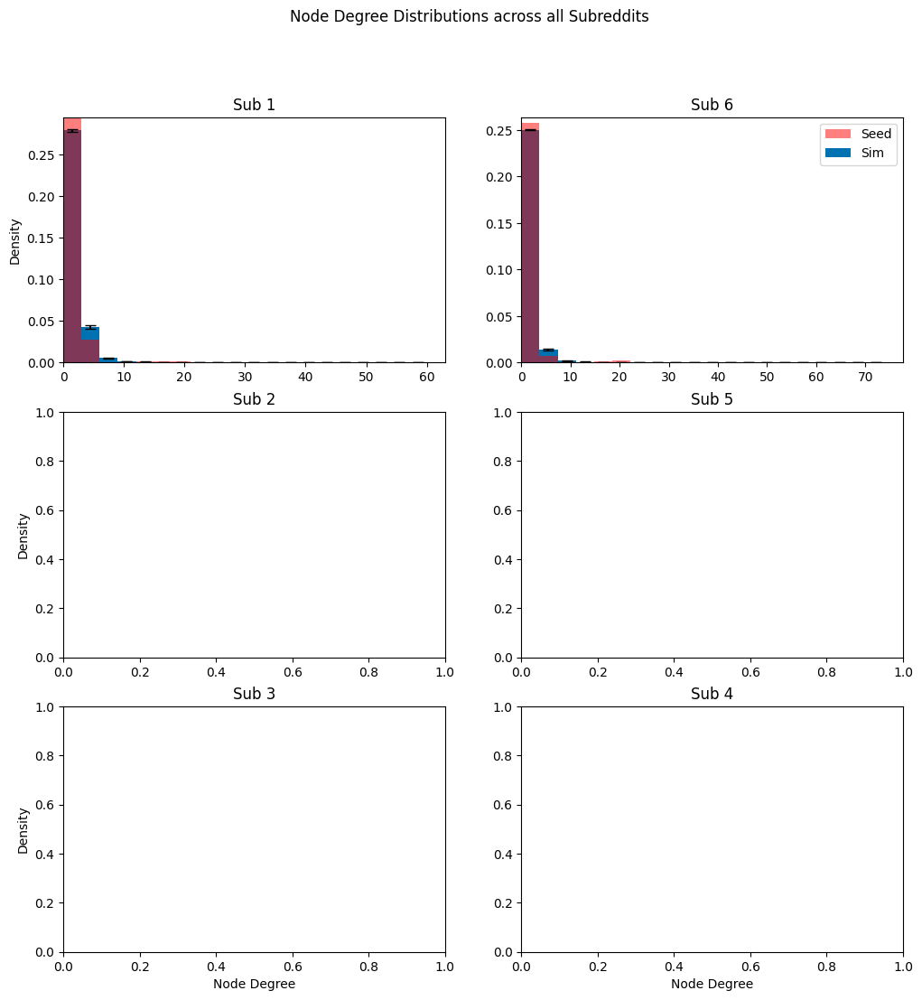

In [39]:
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

temp = [i for j in [sim_network[r][1]["degrees"] for r in range(len(sim_network))] for i in j]
_, bw = plot_multirun_hist_a(temp, density=True, ax=axs[0][0])
temp = [i for j in seed_network[1]["degrees"] for i in j]
axs[0][0].hist(temp, density=True, color="r", alpha=0.5, label="Seed", bins=binner(temp, bw))
axs[0][0].set_title("Sub 1")
axs[0][0].set_ylabel("Density")

temp = [i for j in [sim_network[r][6]["degrees"] for r in range(len(sim_network))] for i in j]
_, bw = plot_multirun_hist_a(temp, density=True, ax=axs[0][1])
temp = [i for j in seed_network[6]["degrees"] for i in j]
axs[0][1].hist(temp, density=True, color="r", alpha=0.5, label="Seed", bins=binner(temp, bw))
axs[0][1].set_title("Sub 6")
axs[0][1].legend()

# axs[1][0].hist([i for j in sim_network[2]["degrees"] for i in j], density=True, bins=20, label="Sim")
# axs[1][0].hist([i for j in seed_network[2]["degrees"] for i in j], density=True, color="r", alpha=0.5, label="Seed")
axs[1][0].set_title("Sub 2")
axs[1][0].set_ylabel("Density")

# axs[1][1].hist([i for j in sim_network[5]["degrees"] for i in j], density=True, bins=20, label="Sim")
# axs[1][1].hist([i for j in seed_network[5]["degrees"] for i in j], density=True, color="r", alpha=0.5, label="Seed")
axs[1][1].set_title("Sub 5")

# axs[2][0].hist([i for j in sim_network[3]["degrees"] for i in j], density=True, bins=20, label="Sim")
# axs[2][0].hist([i for j in seed_network[3]["degrees"] for i in j], density=True, color="r", alpha=0.5, label="Seed")
axs[2][0].set_title("Sub 3")
axs[2][0].set_xlabel("Node Degree")
axs[2][0].set_ylabel("Density")

# axs[2][1].hist([i for j in sim_network[4]["degrees"] for i in j], density=True, bins=20, label="Sim")
# axs[2][1].hist([i for j in seed_network[4]["degrees"] for i in j], density=True, color="r", alpha=0.5, label="Seed")
axs[2][1].set_title("Sub 4")
axs[2][1].set_xlabel("Node Degree")

plt.suptitle("Node Degree Distributions across all Subreddits")
if save_figs:
    plt.savefig("figures/seed-sim_dist_node-degrees-per-sub.pdf")
plt.show()

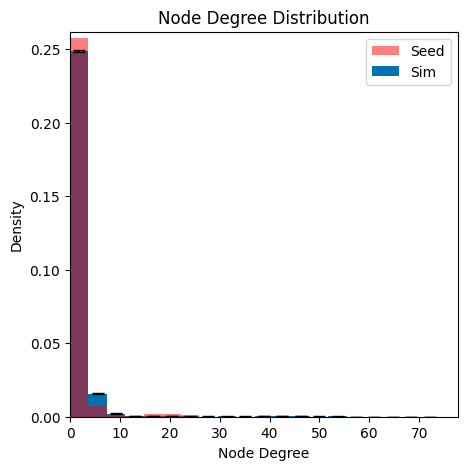

In [40]:
# subs together but runs separate
seed_temp = []
sim_temp = []

for i in simulated_conditions:
    seed_temp.extend([j for k in seed_network[i]["degrees"] for j in k])
for i in sim_network:
    temp = []
    for j in simulated_conditions:
        temp.extend([k for l in i[j]["degrees"] for k in l])
    sim_temp.append(temp)


fig, ax = plt.subplots(1, 1, figsize=figsize_regular)
# plt.hist(sim_temp, density=True, label="Sim", bins=20)
_, bw = plot_multirun_hist_a(sim_temp, density=True, ax=ax, bins=20)
ax.hist(seed_temp, density=True, color="r", alpha=0.5, label="Seed", bins=binner(seed_temp, bw))
ax.set_xlabel("Node Degree")
ax.set_ylabel("Density")
ax.legend()
ax.set_title("Node Degree Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_node-degrees.pdf")
plt.show()

In [41]:
def extract_run_network(x, mode="seed"):
    sim_temp = []
    seed_temp = []

    if mode == "seed":
        for i in simulated_conditions:
            seed_temp.extend(seed_network[i][x])
        return seed_temp
    
    elif mode == "sim":
        for i in sim_network:
            temp = []
            for j in simulated_conditions:
                temp.extend(i[j][x])
            sim_temp.append(temp)
        return sim_temp

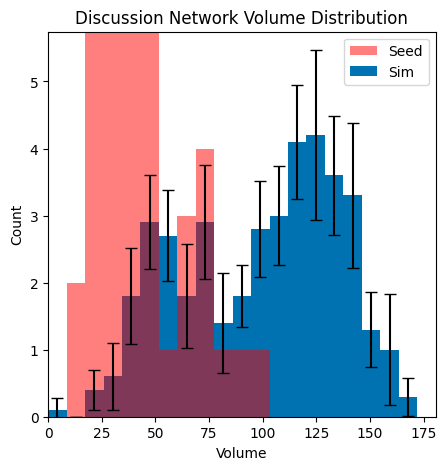

In [42]:
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

_, bw = plot_multirun_hist_a(extract_run_network("size", mode="sim"), ax=ax, bins=20)
temp = extract_run_network("size")
ax.hist(temp, color="r", alpha=0.5, label="Seed", bins=binner(temp, bw))
ax.set_xlabel("Volume")
ax.set_ylabel("Count")
ax.legend()
ax.set_title("Discussion Network Volume Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_thread-volume.pdf")
plt.show()

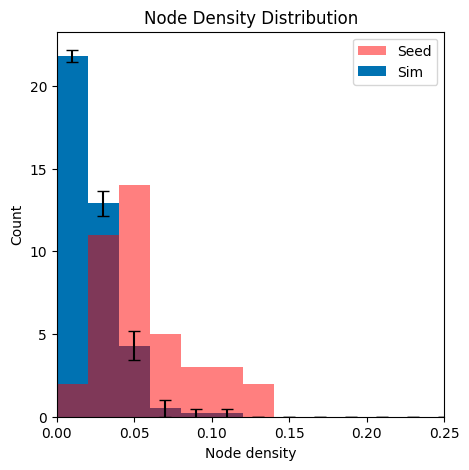

In [43]:
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

_, bw = plot_multirun_hist_a(extract_run_network("density", mode="sim"), ax=ax, bins=100)
temp = extract_run_network("density")
ax.hist(temp, color="r", alpha=0.5, label="Seed", bins=binner(temp, bw))
ax.set_xlabel("Node density")
ax.set_ylabel("Count")
ax.set_xlim(0, 0.25)
ax.legend()
ax.set_title("Node Density Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_node-density.pdf")
plt.show()

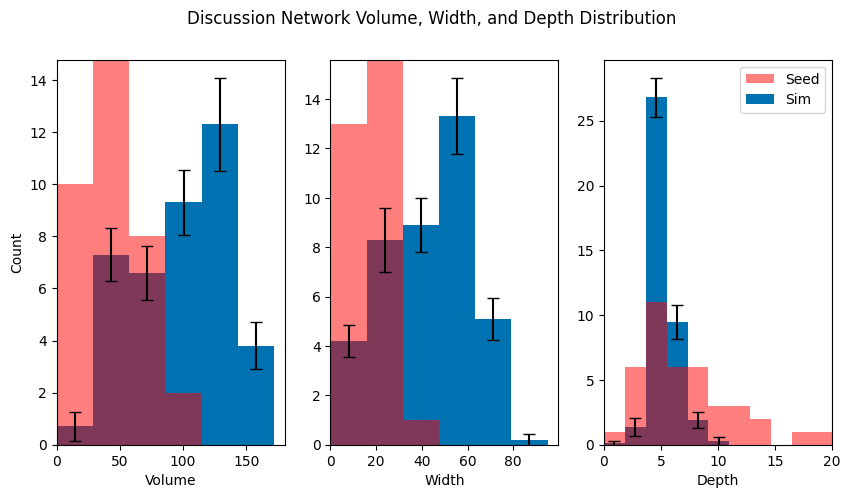

In [44]:
# Plot simulation descriptives
fig, axs = plt.subplots(1, 3, figsize=figsize_wide)

_, bw = plot_multirun_hist_a(extract_run_network("size", mode="sim"), ax=axs[0], bins=6)
temp = extract_run_network("size")
axs[0].hist(temp, color="r", alpha=0.5, label="Seed", bins=binner(temp, bw))
axs[0].set_xlabel("Volume")
axs[0].set_ylabel("Count")

_, bw = plot_multirun_hist_a(extract_run_network("width", mode="sim"), ax=axs[1], bins=6)
temp = extract_run_network("width")
axs[1].hist(temp, color="r", alpha=0.5, label="Seed", bins=binner(temp, bw))
axs[1].set_xlabel("Width")

_, bw = plot_multirun_hist_a(extract_run_network("depth", mode="sim"), ax=axs[2], bins=6)
temp = extract_run_network("depth")
axs[2].hist(temp, color="r", alpha=0.5, label="Seed", bins=binner(temp, bw))
axs[2].set_xlabel("Depth")
axs[2].set_xlim(0, 20)
axs[2].legend()

plt.suptitle("Discussion Network Volume, Width, and Depth Distribution")
if save_figs:
    plt.savefig("figures/seed-sim_dist_vol-width-depth.pdf")
plt.show()

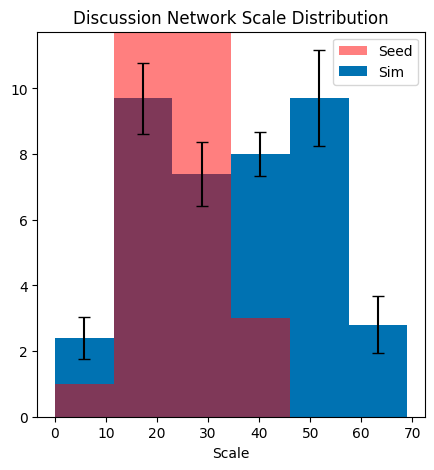

In [45]:
# Plot dist of scale across sim and seed threads
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

sim_temp = [r.groupby(["subreddit", "topic"]).nunique("seed_user_id") for r in sim_discussions_dfs]

_, bw = plot_multirun_hist_b("seed_user_id", sim_temp, ax=ax, bins=6)
ax.set_xlabel("Scale")

temp = discussions_data.groupby([
    "subreddit", "post_title"
]).nunique("ParticipantID")

ax.hist(temp["ParticipantID"], color="r", alpha=0.5, label="Seed", bins=binner(temp["ParticipantID"], bw))
ax.set_xlabel("Scale")
ax.set_title("Discussion Network Scale Distribution")

plt.legend()
if save_figs:
    plt.savefig("figures/seed-sim_dist_scale.pdf")
plt.show()

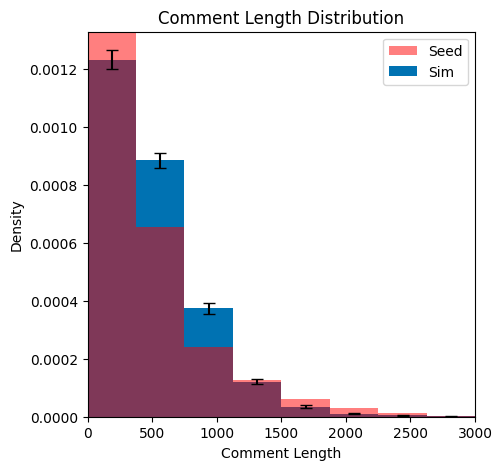

In [46]:
# Plot dist of comment lengths for all Sims
fig, ax = plt.subplots(1, 1, figsize=figsize_regular)

_, bw = plot_multirun_hist_b("sim_comment_length", ax=ax, bins=40, density=True)

temp = discussions_data["length_comment_char"]
ax.hist(temp, color="r", alpha=0.5, bins=binner(temp, bw), label="Seed", density=True)
ax.set_xlabel("Comment Length")
ax.set_xlim(0, 3000)
ax.set_ylabel("Density")
ax.set_title("Comment Length Distribution")

plt.legend()
if save_figs:
    plt.savefig("figures/seed-sim_dist_comment-lengths.pdf")
plt.show()

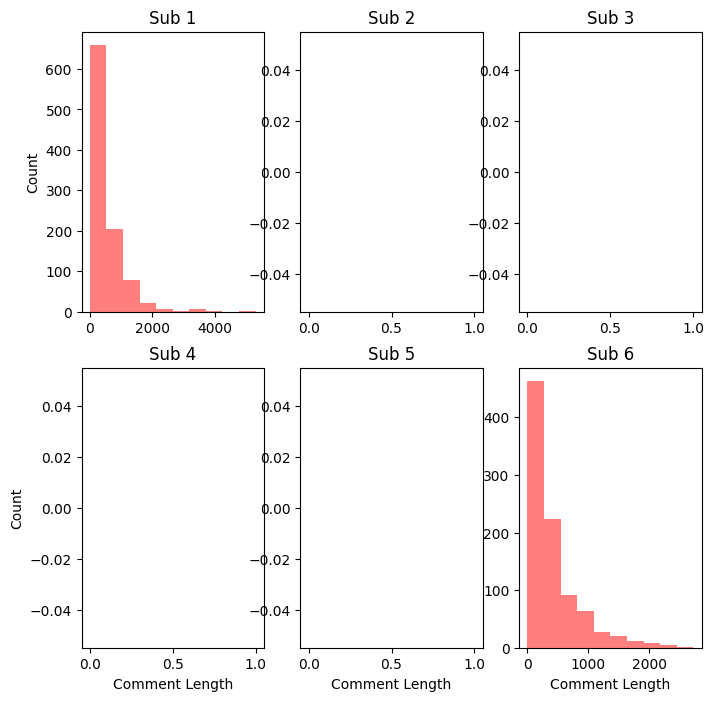

In [47]:
# Plot dist of comment lengths for all Sims
fig, axs = plt.subplots(2, 3, figsize=figsize_large)
k = 1
for i in range(2):
    for j in range(3):
        temp = discussions_data.loc[discussions_data["subreddit"] == (i+1)*(j+1)]
        axs[i][j].hist(
            temp["length_comment_char"], color="r", alpha=0.5, label="Seed"
        )
        axs[i][j].set_title(f"Sub {k}")
        if i > 0:
            axs[i][j].set_xlabel("Comment Length")
        # axs[i][j].set_xlim(0, 2000)
        if j == 0 or j == 3:
            axs[i][j].set_ylabel("Count")
        k += 1

# plt.legend()
if save_figs:
    plt.savefig("figures/seed_dist_sub-comment-lengths.pdf")
plt.show()

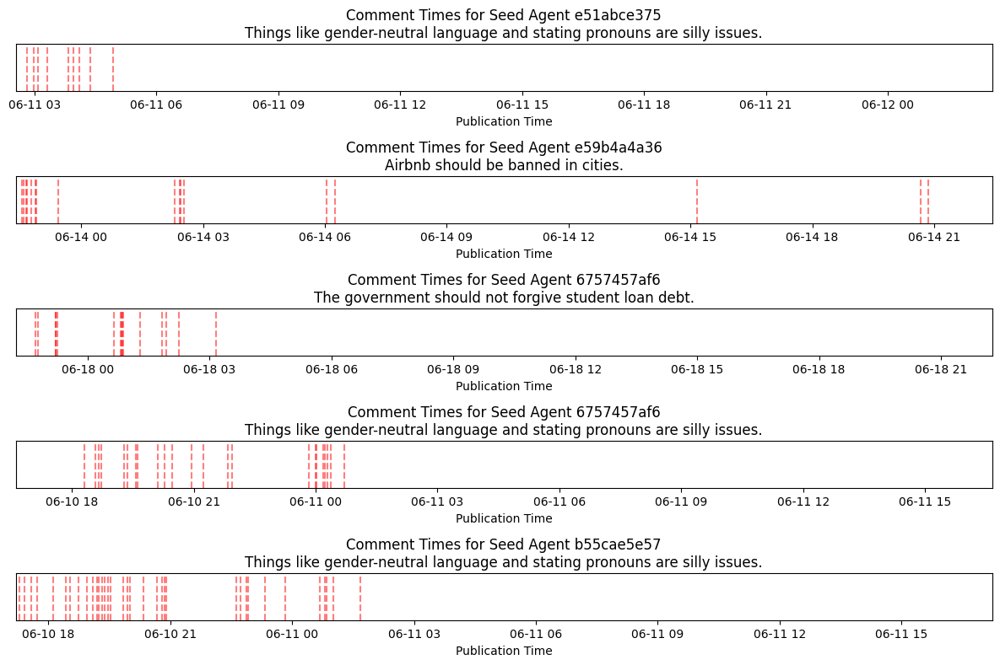

In [48]:
# Seed
temp = discussions_data.groupby(["ParticipantID", "post_title"]).size().sort_values().tail(5)

j = 0
fig, axs = plt.subplots(5, 1, figsize=(12, 8))
for i, r in temp.items():
    comments = discussions_data[
    discussions_data["ParticipantID"] == i[0]
    ]
    comments = comments[comments["post_title"] == i[1]][
    "created_comment"
    ]
    
    for comment in pd.to_datetime(comments):
        axs[j].axvline(x=comment, color="r", alpha=0.5, linestyle="--")
    
    # axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
    #              pd.to_datetime(comments).max() + pd.Timedelta(minutes=1)])
    axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
                 pd.to_datetime(comments).min() + pd.Timedelta(hours=24, minutes=1)])
    # axs[j].set_ylim([0, 0.9])
    axs[j].set_title(f"Comment Times for Seed Agent {i[0]}\n{i[1]}")
    axs[j].set_xlabel("Publication Time")

    axs[j].set_yticks([])

    j += 1

plt.tight_layout()
if save_figs:
    plt.savefig("figures/seed_burst-top-5.pdf")
plt.show()

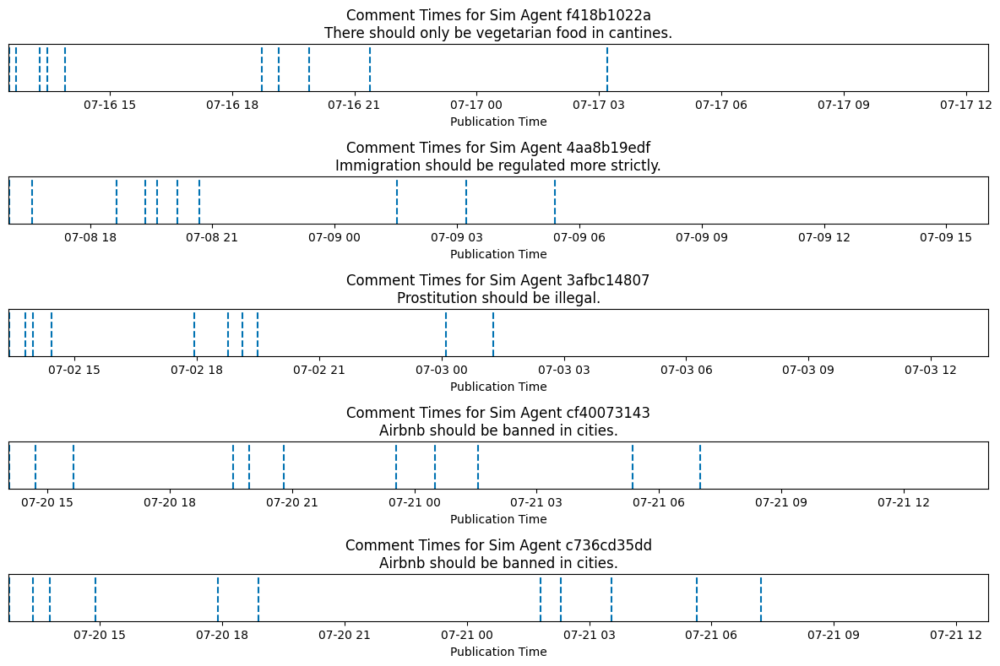

In [49]:
# SIM
temp = sim_discussions_data.groupby(["seed_user_id", "topic_content"]).size().sort_values().tail(5)

j = 0
fig, axs = plt.subplots(5, 1, figsize=(12, 8))
for i, r in temp.items():
    comments = sim_discussions_data[
    sim_discussions_data["seed_user_id"] == i[0]
    ]
    comments = comments[comments["topic_content"] == i[1]][
    "created_at"
    ]
    
    for comment in pd.to_datetime(comments):
        axs[j].axvline(x=comment, linestyle="--", alpha=1)
    
    # axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
    #              pd.to_datetime(comments).max() + pd.Timedelta(minutes=1)])
    axs[j].set_xlim([pd.to_datetime(comments).min() - pd.Timedelta(minutes=1),
                 pd.to_datetime(comments).min() + pd.Timedelta(hours=24, minutes=1)])
    # axs[j].set_ylim([0, 0.9])
    axs[j].set_title(f"Comment Times for Sim Agent {i[0]}\n{i[1]}")
    axs[j].set_xlabel("Publication Time")

    axs[j].set_yticks([])

    j += 1

plt.tight_layout()
if save_figs:
    plt.savefig("figures/sim_burst-top-5.pdf")
plt.show()

In [50]:
# Determine intial activation prob
k = 0
n = 24
ps = [
    0.0025,
    0.00325,
    0.015, 
    0.05, 
    0.1
]

for p in ps:
    print(f"Min. {k+1} over {n}({p})", round(scipy.stats.binom.sf(k, n, p), 3))

Min. 1 over 24(0.0025) 0.058
Min. 1 over 24(0.00325) 0.075
Min. 1 over 24(0.015) 0.304
Min. 1 over 24(0.05) 0.708
Min. 1 over 24(0.1) 0.92


In [51]:
# Visualize Seed activation probability function
discussions_data["created_comment"] = pd.to_datetime(
    discussions_data["created_comment"]
)
discussions_data["interevent_diff"] = discussions_data.sort_values(
    ["ParticipantID", "created_comment"]
).groupby("ParticipantID")["created_comment"].diff().dt.total_seconds()

temp = discussions_data.copy()
temp = temp[temp["subreddit"].isin(simulated_conditions)]

# Intital posts not preceeded by another post hold NA value for ie_diff
seed_ie_total_posts = len(temp)
seed_ie_initial_posts = temp["interevent_diff"].isna().sum()
seed_ie_posts = seed_ie_total_posts - seed_ie_initial_posts
temp.dropna(subset=["interevent_diff"], inplace=True)
temp = temp[temp["interevent_diff"] != 0.0]
# remove outliers
# temp = temp[temp["interevent_diff"] <= get_quartiles(
#     temp["interevent_diff"]
# )[1]]
temp = temp["interevent_diff"].sort_values()
seed_ie_posts_outlier_corrected = len(temp)
seed_ie_posts_outlier_share = round((seed_ie_posts - seed_ie_posts_outlier_corrected) / seed_ie_posts, 3)
ie_times_seed = temp

In [52]:
sim_ie_total_posts = []
sim_ie_initial_posts = []
sim_ie_posts = []
ie_times_sim = []

# Visualize SIM activation probability function
for i in sim_discussions_dfs:
    i["created_at"] = pd.to_datetime(
        i["created_at"]
    )
    i["interevent_diff"] = i.sort_values(
        ["seed_user_id", "created_at"]
    ).groupby("seed_user_id")["created_at"].diff().dt.total_seconds()

    temp = i.copy()
    temp = temp[temp["subreddit"].isin(simulated_conditions)]
    
    # Intital posts not preceeded by another post hold NA value for ie_diff
    sim_ie_total_posts.append(len(temp))
    sim_ie_initial_posts.append(temp["interevent_diff"].isna().sum())
    sim_ie_posts.append(len(temp) - temp["interevent_diff"].isna().sum())
    temp.dropna(subset=["interevent_diff"], inplace=True)
    temp = temp[temp["interevent_diff"] != 0.0]

    ie_times_sim.append(temp)

sim_ie_total_posts = round_mean(sim_ie_total_posts), get_ci(sim_ie_total_posts)
sim_ie_initial_posts = round_mean(sim_ie_initial_posts), get_ci(sim_ie_initial_posts)
sim_ie_posts = round_mean(sim_ie_posts), get_ci(sim_ie_posts)

In [53]:
print("#"*80)
print("{:<30}{:^10}|{:^10}{:^15}".format("Interevent Data", "Seed", "Sim", "CI"))
print("#"*80)
print("{:<30}{:^10}|{:^10}{:^15}".format("Total Posts:", seed_ie_total_posts, sim_ie_total_posts[0], f"{sim_ie_total_posts[1]}"))
print("{:<30}{:^10}|{:^10}{:^15}".format("Initial Posts:", seed_ie_initial_posts, sim_ie_initial_posts[0], f"{sim_ie_initial_posts[1]}"))
print("{:<30}{:^10}|{:^10}{:^15}".format("IE Posts:", seed_ie_posts, sim_ie_posts[0], f"{sim_ie_posts[1]}"))
# print("{:<30}{:^10}|{:^10}".format("IE Posts (Outlier adjusted):", seed_ie_posts_outlier_corrected, sim_ie_posts_outlier_corrected))
# print("{:<30}{:^10}|{:^10}".format("IE Posts % Outliers:", seed_ie_posts_outlier_share, sim_ie_posts_outlier_share))

################################################################################
Interevent Data                  Seed   |   Sim          CI       
################################################################################
Total Posts:                     1897   |  3899.4  (3866.69, 3932.11)
Initial Posts:                   114    |  172.7   (171.53, 173.87)
IE Posts:                        1783   |  3726.7  (3694.11, 3759.29)


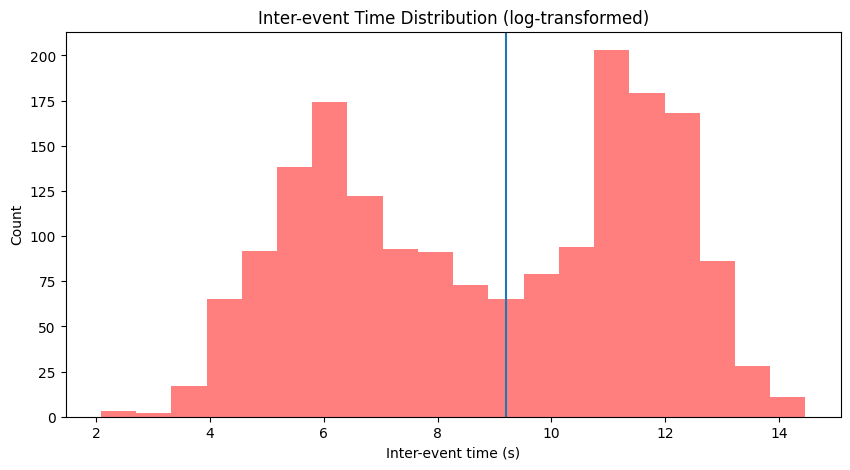

In [54]:
fig, ax = plt.subplots(1,1, figsize=figsize_wide)

ax.hist(np.log(discussions_data["interevent_diff"]), bins=20, color="r", alpha=0.5)
ax.axvline(9.2, color="tab:blue")

ax.set_xlabel("Inter-event time (s)")
ax.set_ylabel("Count")
ax.set_title("Inter-event Time Distribution (log-transformed)")

if save_figs:
    plt.savefig("figures/seed_dist_log-ie.pdf")
plt.show()

In [55]:
# temp = discussions_data[~discussions_data["interevent_diff"].isna()]
temp = discussions_data.copy()

intraburst_data = temp[temp["interevent_diff"] <= np.exp(9.2)]
interburst_data = temp[temp["interevent_diff"] > np.exp(9.2)]

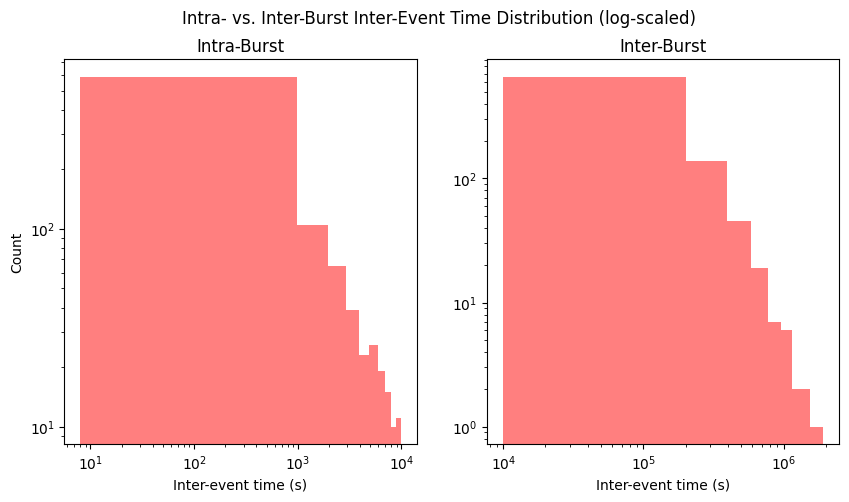

In [56]:
fig, axs = plt.subplots(1, 2, figsize=figsize_wide)

axs[0].hist(intraburst_data["interevent_diff"], color="r", alpha=0.5)
axs[1].hist(interburst_data["interevent_diff"], color="r", alpha=0.5)

axs[0].set_title("Intra-Burst")
axs[0].set_xscale("log")
axs[0].set_xlabel("Inter-event time (s)")
axs[0].set_yscale("log")
axs[0].set_ylabel("Count")

axs[1].set_title("Inter-Burst")
axs[1].set_xscale("log")
axs[1].set_xlabel("Inter-event time (s)")
axs[1].set_yscale("log")

plt.suptitle("Intra- vs. Inter-Burst Inter-Event Time Distribution (log-scaled)")
if save_figs:
    plt.savefig("figures/seed_dist_intra-inter-burst.pdf")
plt.show()

In [57]:
# intraburst_data.to_csv("/../abyss/home/oasis/data/intraevent.csv", index=False)

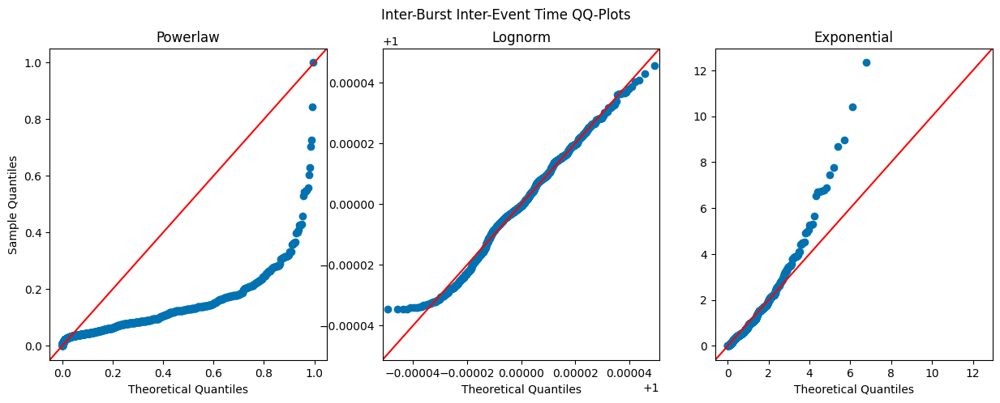

In [58]:
# Interevent
temp = interburst_data
temp = temp["interevent_diff"]

fig, ax = plt.subplots(1, 3, figsize=figsize_ultra_wide)

qqplot(temp, scipy.stats.distributions.powerlaw, line="45", fit=True, ax=ax[0])
ax[0].set_title("Powerlaw")

qqplot(np.log(temp), scipy.stats.distributions.lognorm, line="45", fit=True, ax=ax[1])
ax[1].set_ylabel("")
ax[1].set_title("Lognorm")

qqplot(temp, scipy.stats.distributions.expon, line="45", fit=True, ax=ax[2])
ax[2].set_ylabel("")
ax[2].set_title("Exponential")

plt.suptitle("Inter-Burst Inter-Event Time QQ-Plots")
if save_figs:
    plt.savefig("figures/seed_qqplots_inter-burst.pdf")
plt.show()

In [59]:
# Perform Kolmogorov-Smirnov test
fit_interburst = powerlaw.Fit(xmin=temp.min(), data=temp)

for i, j in zip([fit_interburst.power_law.cdf, fit_interburst.lognormal.cdf, fit_interburst.exponential.cdf], ["powerlaw", "lognormal", "expon"]):
    ks_statistic, p_value = kstest(temp, i)

    print(f"{j} KS Statistic: {ks_statistic}")
    print(f"{j} P-value: {p_value}")

powerlaw KS Statistic: 0.2661461668689245
powerlaw P-value: 1.210390496522637e-55
lognormal KS Statistic: 0.053128598465889576
lognormal P-value: 0.013255783257864046
expon KS Statistic: 0.09143554631789635
expon P-value: 7.231834060416601e-07


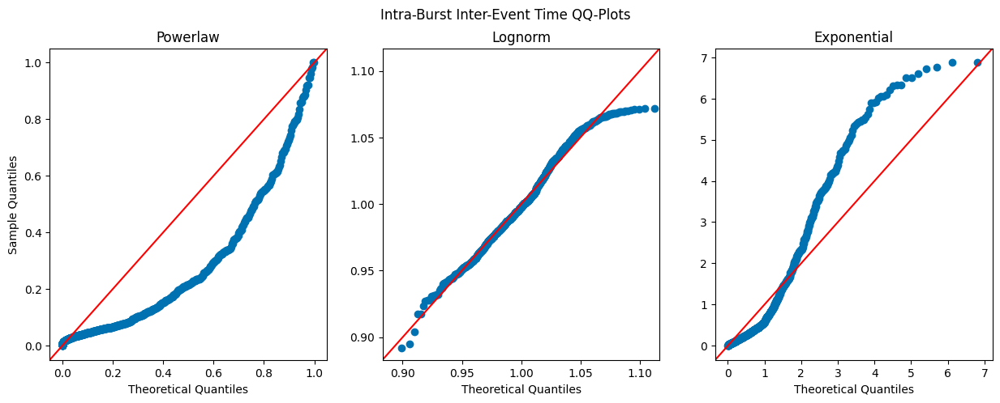

In [60]:
# Intraevent
temp = intraburst_data
temp = temp[temp["interevent_diff"] != 0.0]["interevent_diff"]

fig, ax = plt.subplots(1, 3, figsize=figsize_ultra_wide)

qqplot(temp, scipy.stats.distributions.powerlaw, line="45", fit=True, ax=ax[0])
ax[0].set_title("Powerlaw")

qqplot(np.log(temp), scipy.stats.distributions.lognorm, line="45", fit=True, ax=ax[1])
ax[1].set_ylabel("")
ax[1].set_title("Lognorm")

qqplot(temp, scipy.stats.distributions.expon, line="45", fit=True, ax=ax[2])
ax[2].set_ylabel("")
ax[2].set_title("Exponential")

plt.suptitle("Intra-Burst Inter-Event Time QQ-Plots")
if save_figs:
    plt.savefig("figures/seed_qqplots_intra-burst.pdf")
plt.show()

In [61]:
# Perform Kolmogorov-Smirnov test
fit_intraburst = powerlaw.Fit(xmin=temp.min(), data=temp)

for i, j in zip([fit_intraburst.power_law.cdf, fit_intraburst.lognormal.cdf, fit_intraburst.exponential.cdf], ["powerlaw", "lognormal", "expon"]):
    ks_statistic, p_value = kstest(temp, i)

    print(f"{j} KS Statistic: {ks_statistic}")
    print(f"{j} P-value: {p_value}")

powerlaw KS Statistic: 0.3512143556665225
powerlaw P-value: 7.068412642154448e-100
lognormal KS Statistic: 0.04544856751169524
lognormal P-value: 0.046881475584921506
expon KS Statistic: 0.2107857301028066
expon P-value: 1.3332032430005144e-35


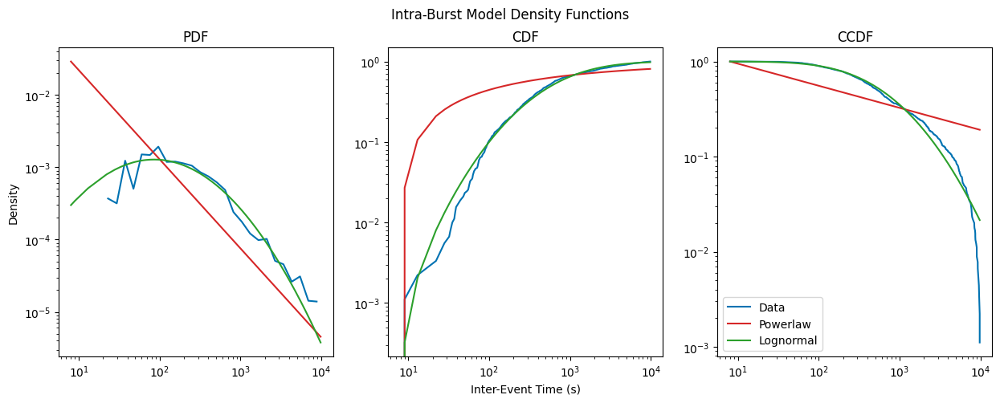

In [62]:
fig, axs = plt.subplots(1, 3, figsize=figsize_ultra_wide)

fit_intraburst.plot_pdf(ax=axs[0])
fit_intraburst.power_law.plot_pdf(color="tab:red", ax=axs[0])
fit_intraburst.lognormal.plot_pdf(color="tab:green", ax=axs[0])
# fit.exponential.plot_pdf(color="r", ax=axs[0])

fit_intraburst.plot_cdf(ax=axs[1])
fit_intraburst.power_law.plot_cdf(color="tab:red", ax=axs[1])
fit_intraburst.lognormal.plot_cdf(color="tab:green", ax=axs[1])
# fit.exponential.plot_cdf(color="r", ax=axs[1])

fit_intraburst.plot_ccdf(ax=axs[2], label="Data")
fit_intraburst.power_law.plot_ccdf(color="tab:red", ax=axs[2], label="Powerlaw")
fit_intraburst.lognormal.plot_ccdf(color="tab:green", ax=axs[2], label="Lognormal")
# fit.exponential.plot_ccdf(color="r", ax=axs[2], label="Exponential")

axs[0].set_ylabel("Density")
axs[0].set_title("PDF")

axs[1].set_xlabel("Inter-Event Time (s)")
axs[1].set_title("CDF")

axs[2].set_title("CCDF")

plt.legend()
plt.suptitle("Intra-Burst Model Density Functions")
if save_figs:
    plt.savefig("figures/seed_intra-burst-fit_density-func.pdf")
plt.show()

In [63]:
# Perform Kolmogorov-Smirnov test
fit = powerlaw.Fit(xmin=discussions_data["interevent_diff"].min(), data=discussions_data["interevent_diff"])

for i, j in zip([fit.power_law.cdf, fit.lognormal.cdf, fit.exponential.cdf], ["powerlaw", "lognormal", "expon"]):
    ks_statistic, p_value = kstest(temp, i)

    print(f"{j} KS Statistic: {ks_statistic}")
    print(f"{j} P-value: {p_value}")

powerlaw KS Statistic: 0.35266969265967996
powerlaw P-value: 9.961160064136069e-101
lognormal KS Statistic: 0.47018191796163744
lognormal P-value: 3.185930250080669e-183
expon KS Statistic: 0.8882603711452208
expon P-value: 0.0


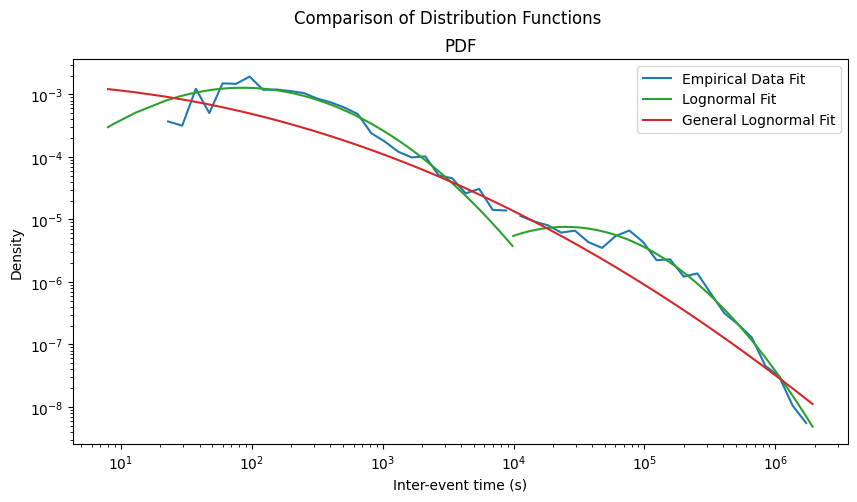

In [64]:
fig, axs = plt.subplots(1, 1, figsize=figsize_wide)

fit_intraburst.plot_pdf(ax=axs, color="tab:blue")
# fit.power_law.plot_pdf(color="r", ax=axs)
fit_intraburst.lognormal.plot_pdf(color="tab:green", ax=axs)

fit_interburst.plot_pdf(ax=axs, color="tab:blue", label="Empirical Data Fit")
# fit.power_law.plot_pdf(color="r", ax=axs)
fit_interburst.lognormal.plot_pdf(color="tab:green", ax=axs, label="Lognormal Fit")

fit.lognormal.plot_pdf(color="tab:red", ax=axs, label="General Lognormal Fit")

axs.set_xlabel("Inter-event time (s)")
axs.set_ylabel("Density")
axs.set_title("PDF")

plt.legend()
plt.suptitle("Comparison of Distribution Functions")
if save_figs:
    plt.savefig("figures/seed_intra-inter-burst-fit_pdf.pdf")
plt.show()

In [65]:
mu = fit_intraburst.lognormal.mu
sigma = fit_intraburst.lognormal.sigma
alpha = fit_intraburst.power_law.alpha

print(f"Lognorm mu: {mu}")
print(f"Lognorm sigma: {sigma}")
print(f"Powerlaw alpha: {alpha}")

Lognorm mu: 6.379525877997073
Lognorm sigma: 1.3899986606297763
Powerlaw alpha: 1.2323048606258498


In [66]:
# Compare power law with exponential distribution
R, p = fit_intraburst.distribution_compare("lognormal", "exponential")
print(f"power-law vs. exponential: R = {R}, p = {p}")

# Compare power law with log-normal distribution
R, p = fit_intraburst.distribution_compare("lognormal", "power_law")
print(f"power-law vs. log-normal: R = {R}, p = {p}")

power-law vs. exponential: R = 123.97164440472409, p = 3.5881721143406895e-19
power-law vs. log-normal: R = 646.5728538430074, p = 7.321389687849388e-240


In [67]:
# Lognormal dist fits data best ()
x = 3600
cdf_value = round(scipy.stats.lognorm.sf(x, s=fit_intraburst.lognormal.sigma, scale=np.exp(fit_intraburst.lognormal.mu)), 3)
print(f"P(i) at {round(x/60/60, 2)}h ({x}s) is {cdf_value}")

P(i) at 1.0h (3600s) is 0.097


In [68]:
# I get the longest IE diff of all simulations (per topic and sub)
sim_max_ie_diff = sim_discussions_dfs[0].groupby(
    ["subreddit", "topic"]
)["created_at"].agg(lambda x: (x.max() - x.min()).total_seconds()).max()

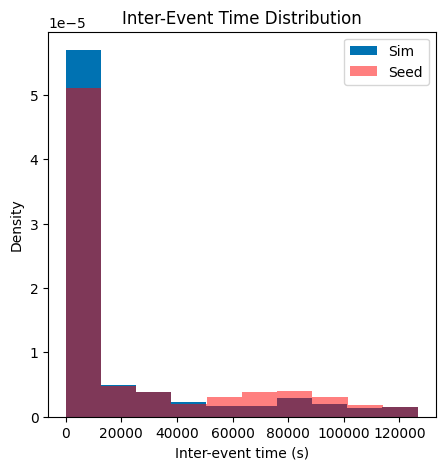

In [69]:
fig, axs = plt.subplots(1, 1, figsize=figsize_regular)

axs.hist([i for i in ie_times_sim[0]["interevent_diff"] if i < sim_max_ie_diff], density=True, label="Sim")
axs.hist([i for i in ie_times_seed if i < sim_max_ie_diff], density=True, alpha=0.5, bins=10, label="Seed", color="r")
# axs.hist(temp, density=True, bins=5468)

axs.set_xlabel("Inter-event time (s)")
# axs.set_xscale("log")
# axs.set_xlim(0, 180000)
axs.set_ylabel("Density")
# axs.set_yscale("log")


plt.title("Inter-Event Time Distribution")
plt.legend()
if save_figs:
    plt.savefig("figures/seed-sim_dist_ie-times.pdf")
plt.show()

In [70]:
kstest([i for i in ie_times_sim[0]["interevent_diff"] if i < sim_max_ie_diff], [i for i in ie_times_seed if i < sim_max_ie_diff])

KstestResult(statistic=0.3664799677540623, pvalue=1.5243723233739199e-117, statistic_location=1066.0, statistic_sign=-1)

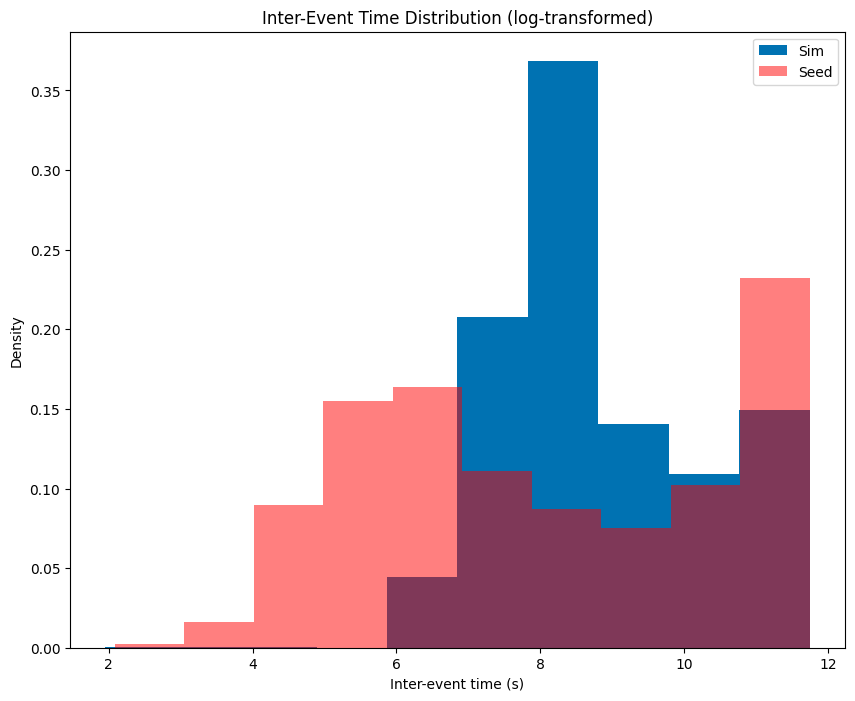

In [71]:
fig, axs = plt.subplots(1, 1, figsize=(10, 8))

axs.hist(np.log([i for i in ie_times_sim[0]["interevent_diff"] if i < sim_max_ie_diff]), density=True, label="Sim")
axs.hist(np.log([i for i in ie_times_seed if i < sim_max_ie_diff]), density=True, alpha=0.5, bins=10, label="Seed", color="r")
# axs.hist(temp, density=True, bins=5468)

axs.set_xlabel("Inter-event time (s)")
axs.set_ylabel("Density")


plt.title("Inter-Event Time Distribution (log-transformed)")
plt.legend()
if save_figs:
    plt.savefig("figures/seed-sim_dist_ie-times-log.pdf")
plt.show()

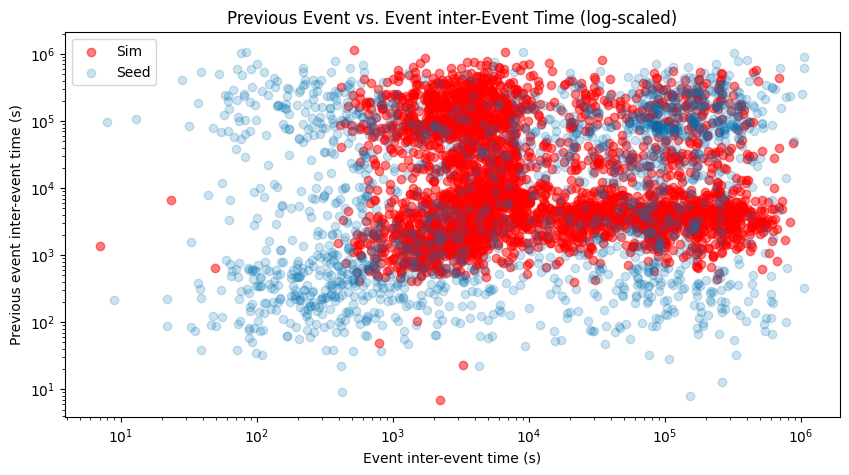

In [72]:
temp = discussions_data[discussions_data["interevent_diff"] <= sim_discussions_dfs[0]["interevent_diff"].max()]
# temp = discussions_data[discussions_data["interevent_diff"] <= np.exp(9)]


temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_comment").groupby("ParticipantID").filter(lambda x: len(x) > 1)

seed_x = temp.groupby("ParticipantID").apply(lambda x: x.tail(len(x) - 1), include_groups=False)["interevent_diff"]
seed_y = temp.groupby("ParticipantID").apply(lambda x: x.head(len(x) - 1), include_groups=False)["interevent_diff"]

temp = sim_discussions_dfs[0]#[sim_discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_at").groupby("seed_user_id").filter(lambda x: len(x) > 1)

sim_x = temp.groupby("seed_user_id").apply(lambda x: x.tail(len(x) - 1), include_groups=False)["interevent_diff"]
sim_y = temp.groupby("seed_user_id").apply(lambda x: x.head(len(x) - 1), include_groups=False)["interevent_diff"]

# Plot IE diff for current and prev event

fig, ax = plt.subplots(1, 1, figsize=figsize_wide)

ax.scatter(sim_x, sim_y, alpha=0.5, label="Sim", color="r")
ax.scatter(seed_x, seed_y, alpha=0.2, label="Seed")

ax.set_xlabel("Event inter-event time (s)")
ax.set_ylabel("Previous event inter-event time (s)")

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_title("Previous Event vs. Event inter-Event Time (log-scaled)")
ax.legend()

if save_figs:
    plt.savefig("figures/seed-sim_scatter_ie-prev-current-event.pdf")
plt.show()

In [73]:
temp = discussions_data#[discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_comment").groupby("ParticipantID").filter(lambda x: len(x) > 1)

mean_corrs = temp.groupby("ParticipantID").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1)[1], include_groups=False)

np.mean(mean_corrs)

-0.07219301838127797

In [74]:
temp = sim_discussions_dfs[0]#[sim_discussions_data["interevent_diff"] <= np.exp(9)]

temp = temp[~temp["interevent_diff"].isna()]

temp = temp.sort_values("created_at").groupby("seed_user_id").filter(lambda x: len(x) > 1)

mean_corrs = temp.groupby("seed_user_id").apply(lambda x: sm.tsa.acf(x["interevent_diff"], nlags=1)[1], include_groups=False)

np.mean(mean_corrs)

-0.18389075761540752

***
# Content Analysis

In [76]:
if run_perspective:
    with open("perspective_secret.txt", "r") as f:
        api_key = f.read()
    
    for i in range(len(sim_discussions_dfs)):
        sim_discussions_dfs[i]["n_run"] = i+1
        sim_discussions_dfs[i]["content_toxicity"] = sim_discussions_dfs[i]["content"].progress_apply(pu.query_perspective, api_key=api_key)
    
    perspective_data = pd.DataFrame()
    
    for i in sim_discussions_dfs:
        perspective_data = pd.concat([perspective_data, i])
    
    perspective_data.to_csv("/../abyss/home/oasis/data/sim_discussions_data_perspective.csv", index=False)

else:
    perspective_data = pd.read_csv("/../abyss/home/oasis/data/sim_discussions_data_perspective.csv")

In [77]:
for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = user_data[user_data["comment_mean_tox"] != 0]
    y = temp.groupby("seed_user_id")["content_toxicity"].apply(np.mean)

    temp = x[["ParticipantID", "comment_mean_tox"]].merge(y, left_on="ParticipantID", right_on="seed_user_id")
    # print(temp.isna().any())
    print(scipy.stats.pearsonr(temp["comment_mean_tox"], temp["content_toxicity"]))

PearsonRResult(statistic=0.1796416661568918, pvalue=0.06669976746621233)
PearsonRResult(statistic=0.13507239775219726, pvalue=0.16140382794948563)
PearsonRResult(statistic=0.034701527878743345, pvalue=0.7214362523508301)
PearsonRResult(statistic=0.17028536144567122, pvalue=0.07807640083950303)
PearsonRResult(statistic=0.1727292657505834, pvalue=0.0711539265330908)
PearsonRResult(statistic=-0.02956142704150199, pvalue=0.7591721365524139)
PearsonRResult(statistic=-0.029260847498232403, pvalue=0.7626254393969378)
PearsonRResult(statistic=0.1387347921662856, pvalue=0.15411969452230925)
PearsonRResult(statistic=0.09445094419121944, pvalue=0.33319513971196857)
PearsonRResult(statistic=0.06746154874979364, pvalue=0.4878616121767512)


In [78]:
perspective_data["content_toxicity"].median()

0.119997114

In [79]:
discussions_data["comment_toxicity"].median()

0.048099842

In [80]:
print(perspective_data["content_toxicity"].mean())
y = perspective_data.groupby("topic_content")["content_toxicity"].apply(np.mean)
y

0.1563500588019413


topic_content
A universal basic income would kill the economy.                                                          0.138637
Airbnb should be banned in cities.                                                                        0.098522
Artificial intelligence should replace humans where possible.                                             0.090270
Climate change is one of the greatest threats to humanity.                                                0.117121
Employers should mandate vaccination.                                                                     0.110042
Fur clothing should be banned.                                                                            0.158587
Immigration should be regulated more strictly.                                                            0.169798
Police officers should wear body cameras.                                                                 0.111486
Prostitution should be illegal.                                   

In [81]:
print(discussions_data["comment_toxicity"].mean())
x = discussions_data.groupby("post_title")["comment_toxicity"].apply(np.mean)
x

0.10277250295871963


post_title
A universal basic income would kill the economy.                                                          0.077267
Airbnb should be banned in cities.                                                                        0.041915
Artificial intelligence should replace humans where possible.                                             0.036718
Climate change is one of the greatest threats to humanity.                                                0.059815
Employers should mandate vaccination.                                                                     0.068834
Fur clothing should be banned.                                                                            0.082148
Immigration should be regulated more strictly.                                                            0.078789
Police officers should wear body cameras.                                                                 0.078369
Prostitution should be illegal.                                      

In [82]:
scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.8742659154286783, pvalue=4.68501778297672e-07)

In [83]:
# Correlation of parent comment and reply length - seed
x = []
y = []

temp = discussions_data[discussions_data["parent_id"].isin(discussions_data["comment_id"])].set_index("comment_id")

for i, r in temp.iterrows():
    parent_id = r["parent_id"]
    if parent_id in temp.index:
        y.append(r["length_comment_char"])
        x.append(temp.at[parent_id, "length_comment_char"])

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.44497879517779404, pvalue=8.200098060083737e-39)

In [84]:
perspective_data["new_id"] = perspective_data['n_run'].astype(str) + "_" + perspective_data['subreddit'].astype(str)  + "_" + perspective_data['topic'].astype(str) + "_" + perspective_data['comment_id'].astype(str)
perspective_data["new_parent_id"] = perspective_data['n_run'].astype(str) + "_" + perspective_data['subreddit'].astype(str)  + "_" + perspective_data['topic'].astype(str)  + "_" + perspective_data['parent_comment_id'].astype(str)

In [85]:
# Correlation of parent comment and reply length - seed
x = []
y = []

temp = perspective_data[perspective_data["new_parent_id"].isin(perspective_data["new_id"])].set_index("new_id")

for i, r in temp.iterrows():
    parent_id = r["new_parent_id"]
    if parent_id in temp.index:
        y.append(r["sim_comment_length"])
        x.append(temp.at[parent_id, "sim_comment_length"])

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.23377442915815516, pvalue=3.180974840820189e-116)

In [86]:
# Correlation of parent comment and reply length - seed
coeffs = []
ps = []

for r in range(1, 11):
    x = []
    y = []
    
    temp = perspective_data[perspective_data["new_parent_id"].isin(perspective_data["new_id"])].set_index("new_id")
    temp = temp[temp["n_run"] == r]
    
    for i, r in temp.iterrows():
        parent_id = r["new_parent_id"]
        if parent_id in temp.index:
            y.append(r["sim_comment_length"])
            x.append(temp.at[parent_id, "sim_comment_length"])
    
    coeffs.append(scipy.stats.pearsonr(x, y)[0])
    ps.append(scipy.stats.pearsonr(x, y)[1])

print(round_mean(coeffs, digits=3), get_ci(coeffs, digits=3))
print(round_mean(ps, digits=3), get_ci(ps, digits=3))

0.233 (0.202, 0.263)
0.0 (-0.0, 0.0)


***
# Interaction Analysis

In [87]:
discussions_data["created_comment"] = pd.to_datetime(
    discussions_data["created_comment"]
)
discussions_data.groupby(["subreddit", "post_title"])["created_comment"].transform(
    lambda x: x.max() - x.min()
).median()

Timedelta('6 days 00:31:01')

In [88]:
# Correlation between self-reported vars and comment # for llm agents
for j in ["polinterest", "time_online", "social_media", "comments_online"]:
        corr = scipy.stats.spearmanr(sim_user_data["sim_comment_count"],
                                     sim_user_data[j])
        print(j, corr[0], corr[1])

polinterest 0.10998007741013503 0.1416375950090745
time_online 0.26142746163917724 0.0003928634421349915
social_media 0.21789768615574417 0.00329880680587256
comments_online 0.8333031436717667 1.0805682793087944e-47


In [89]:
# Correlation between self-reported vars and comment # for seed users
for j in ["polinterest", "time_online", "social_media", "comments_online"]:
        corr = scipy.stats.spearmanr(user_data["comment_count"],
                                     user_data[j])
        print(j, corr[0], corr[1])

polinterest -0.09329179330733586 0.21289682070063573
time_online -0.05610730324775673 0.4543975735117016
social_media 0.003319901272030702 0.9647203003814748
comments_online 0.07317276640285604 0.3289724720627104


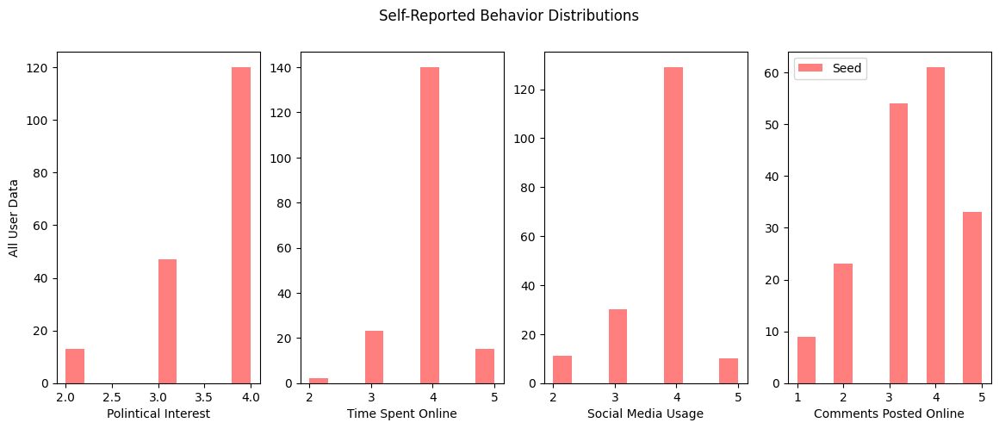

In [90]:
# Comparison of self-reported vars in whole sample vs. Sub 1
fig, axs = plt.subplots(1, 4, figsize=(14, 5))

axs[0].hist(user_data["polinterest"], color="r", alpha=0.5)
axs[0].set_xlabel("Polintical Interest")
axs[0].set_ylabel("All User Data")

axs[1].hist(user_data["time_online"], color="r", alpha=0.5)
axs[1].set_xlabel("Time Spent Online")

axs[2].hist(user_data["social_media"], color="r", alpha=0.5)
axs[2].set_xlabel("Social Media Usage")

axs[3].hist(user_data["comments_online"], color="r", alpha=0.5, label="Seed")
axs[3].set_xlabel("Comments Posted Online")
axs[3].legend()

plt.suptitle("Self-Reported Behavior Distributions")
if save_figs:
    plt.savefig("figures/seed_dist_self-reported-behavior.pdf")
plt.show()

In [91]:
temp = sim_user_data.sort_values("seed_user_id")

sample = pd.read_csv("/../abyss/home/oasis/oswald-et-al_2025/sample_anon.csv")

perspective_data = pd.read_csv("/../abyss/home/oasis/data/sim_discussions_data_perspective.csv")

In [92]:
# Correlation between user/agent activity
seed_sim_activity_corr = []

for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = user_data
    y = temp.groupby("seed_user_id").size()
    y.rename("sim_comment_count", inplace=True)

    temp = x[["ParticipantID", "comment_count"]].merge(y, left_on="ParticipantID", right_on="seed_user_id", how="outer")
    temp.fillna(0, inplace=True)
    seed_sim_activity_corr.append(scipy.stats.pearsonr(temp["comment_count"], temp["sim_comment_count"]))

In [93]:
coeffs = [i[0] for i in seed_sim_activity_corr]
ps = [i[1] for i in seed_sim_activity_corr]

print(round_mean(coeffs), get_ci(coeffs))
print(round_mean(ps), get_ci(ps))

0.15 (0.14, 0.17)
0.05 (0.03, 0.08)


In [94]:
# Correlation between user/agent activity (active users only)
seed_sim_activity_corr_actives = []

for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = user_data[user_data["comment_count"] != 0]
    y = temp.groupby("seed_user_id").size()
    y.rename("sim_comment_count", inplace=True)

    temp = x[["ParticipantID", "comment_count"]].merge(y, left_on="ParticipantID", right_on="seed_user_id")
    temp.fillna(0, inplace=True)
    seed_sim_activity_corr_actives.append(scipy.stats.pearsonr(temp["comment_count"], temp["sim_comment_count"]))

In [95]:
coeffs = [i[0] for i in seed_sim_activity_corr_actives]
ps = [i[1] for i in seed_sim_activity_corr_actives]

print(round_mean(coeffs), get_ci(coeffs))
print(round_mean(ps), get_ci(ps))

0.19 (0.17, 0.22)
0.07 (0.02, 0.11)


In [99]:
# Correlation between a topic's toxicity and comment volume - seed
x = discussions_data.groupby("post_title")["comment_toxicity"].mean()
y = discussions_data.groupby("post_title")["Collected comments"].unique().apply(sum)

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=0.20108212666569675, pvalue=0.39527155658029034)

In [100]:
# Correlation between a topic's toxicity and comment volume - sim
for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    x = temp.groupby("topic_content")["content_toxicity"].mean()
    y = temp.groupby("topic_content").size()
    
    print(scipy.stats.pearsonr(x, y))

PearsonRResult(statistic=0.15613892085724693, pvalue=0.5109471732208523)
PearsonRResult(statistic=0.14541320146909986, pvalue=0.5407361346187567)
PearsonRResult(statistic=-0.033115691944082606, pvalue=0.8897668062956942)
PearsonRResult(statistic=0.1563966112079428, pvalue=0.5102412618769981)
PearsonRResult(statistic=0.10490097596442224, pvalue=0.6598341287710888)
PearsonRResult(statistic=0.08534725872936816, pvalue=0.7205214959425461)
PearsonRResult(statistic=-0.24663370500015033, pvalue=0.2945173097529431)
PearsonRResult(statistic=0.2263923579272262, pvalue=0.3371524929903917)
PearsonRResult(statistic=0.16168619111154867, pvalue=0.4958548679702449)
PearsonRResult(statistic=0.19447148118781848, pvalue=0.41130972059830173)


In [101]:
x = discussions_data.groupby("post_title").size()

for i in range(1, 11):
    temp = perspective_data[perspective_data["n_run"] == i]
    y = temp.groupby("topic_content").size()
    # print(y)

scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=-0.2644810231566431, pvalue=0.25980682103670194)

In [102]:
x = discussions_data[discussions_data["subreddit"] == 1].groupby("post_title").size()
y = discussions_data[discussions_data["subreddit"] == 6].groupby("post_title").size()
scipy.stats.pearsonr(x, y)

PearsonRResult(statistic=-0.13641213322734433, pvalue=0.566330371585737)

# Process data to be compatible with Oswald 02-RQ1-participation.Rmd

In [ ]:
if output_oswald_data:
    sample = sample[[
        "ParticipantID", 
        "gender", 
        "age",
        "education", 
        "leftright", 
        "affective_polarization", 
        "affective_pol_1",
        "affective_pol_2",
        "pol_cynicism",
        "efficacy",
        "trust_general_1",
        "trust_general_2",
        "trust_general_3",
        "trust_general_4"
    ]]
    
    run = perspective_data[perspective_data["n_run"].isin(list(range(1, 11)))]
    temp = temp.set_index("seed_user_id").merge(run.groupby("seed_user_id")["content_toxicity"].mean(), left_index=True, right_index=True, how="outer").reset_index()
    temp.rename(columns={"content_toxicity": "comment_mean_tox"}, inplace=True)
    
    temp = temp.merge(sample, left_on="seed_user_id", right_on="ParticipantID")
    
    temp = temp.drop("ParticipantID", axis=1)
    
    temp.to_csv("/../abyss/home/sim_sample_data_all.csv", index=False)
    
    temp = perspective_data[perspective_data["n_run"] == 1]
    temp = temp[temp["subreddit"].isin([1, 6])]
    temp.to_csv("/../abyss/home/sim_discussions_data.csv", index=False)

***
# Two-Step Join Analysis

In [147]:
join_dfs = []

for i in range(3, 11):
    run_dir = "{:02d}".format(i)
    join_dfs.append(pd.read_csv(f"/../abyss/home/oasis/data/{run_dir}_run/sim_metrics.csv",
                        converters={"joined_agents": pd.eval,
                                   "disconnected_agents": pd.eval}))

join_data = join_dfs[0]

In [148]:
len(join_dfs)

8

In [149]:
join_data.columns

Index(['subreddit', 'topic', 'joined_agents', 'disconnected_agents'], dtype='object')

In [150]:
join_data["n_joined_agents"] = join_data["joined_agents"].apply(len)
join_data["n_disconnected_agents"] = join_data["disconnected_agents"].apply(len)

In [151]:
join_data["joined_users"] = list(discussions_data.groupby(["subreddit", "topic"])["ParticipantID"].unique())
join_data["n_joined_users"] = join_data["joined_users"].apply(len)

In [152]:
temp = []
temp_n = []
for i, r in join_data.iterrows():
    m = [i for i in r["joined_agents"] if i in r ["joined_users"]]
    temp.append(m)
    temp_n.append(len(m) / len(r["joined_agents"]))

In [153]:
join_data["joined_match"] = temp
join_data["joined_correct"] = temp_n

In [154]:
join_data

,subreddit,topic,joined_agents,disconnected_agents,n_joined_agents,n_disconnected_agents,joined_users,n_joined_users,joined_match,joined_correct
0,1,1,"[2b7239befb, f232063f58, e34e6c69cd, 536f973f0...","[5, 6, 8, 9, 11, 15, 20, 21, 25, 28, 29, 33, 3...",80,34,"[065f4ecbef, 55f9f235c7, b7bbd5cd51, fc37bfdd3...",17,"[065f4ecbef, 20755dab4b, e51abce375, b7bbd5cd5...",0.212500
1,1,2,"[f232063f58, e34e6c69cd, 7e3d73c71f, 9d5641c98...",[],24,0,"[065f4ecbef, 0cc8f32fca, a878f9f52d, 55f9f235c...",18,"[4858d99a77, e4b8dcd343, 61edaf9c9e, 7eb846113...",0.291667
2,1,3,"[f232063f58, 7e3d73c71f, 14d3fd045f, 4858d99a7...","[1, 4, 38, 49]",24,4,"[72df7fc80b, a878f9f52d, b7bbd5cd51, 065f4ecbe...",40,"[7e3d73c71f, 4858d99a77, a6760b4720, bb3a8fd9e...",0.458333
3,1,4,"[2b7239befb, f232063f58, e34e6c69cd, 7e3d73c71...","[1, 4, 5, 10, 14, 15, 25, 34, 35, 42, 45, 48, ...",63,22,"[a878f9f52d, 7e3d73c71f, 8bea3e8d82, 08e8f9494...",29,"[e34e6c69cd, 7e3d73c71f, 20755dab4b, a878f9f52...",0.365079
4,1,5,"[2b7239befb, f232063f58, e34e6c69cd, 536f973f0...","[4, 5, 7, 8, 12, 13, 14, 16, 17, 18, 20, 26, 3...",78,34,"[4aa8b19edf, fc37bfdd35, 20755dab4b, 72df7fc80...",11,"[20755dab4b, e51abce375, 9013b68a49, fc37bfdd3...",0.141026
5,1,6,"[2b7239befb, e34e6c69cd, 536f973f0c, e7f0ed645...","[6, 7, 8, 9, 12, 15, 17, 18, 21, 25, 26, 32, 3...",68,25,"[4aa8b19edf, 4858d99a77, 0cc8f32fca, 72df7fc80...",25,"[e34e6c69cd, 065f4ecbef, 20755dab4b, a878f9f52...",0.264706
6,1,7,"[2b7239befb, 536f973f0c, 7e3d73c71f, 371a89c86...","[0, 3, 37, 42, 52]",35,5,"[a878f9f52d, 9013b68a49, e4b8dcd343, e34e6c69c...",25,"[065f4ecbef, a6760b4720, 9013b68a49, b7bbd5cd5...",0.314286
7,1,8,"[2b7239befb, f232063f58, 536f973f0c, 7e3d73c71...","[1, 4, 8, 9, 13, 17, 21, 29, 32, 38, 40, 41, 5...",55,21,"[b11c090890, f0060695dc, db05203d0d, 4a7abb71f...",15,"[e51abce375, 9013b68a49, fc37bfdd35, 61edaf9c9...",0.181818
8,1,9,"[e34e6c69cd, 371a89c864, 1f2df1f519, 20755dab4...",[],33,0,"[065f4ecbef, 4aa8b19edf, 61edaf9c9e, 6757457af...",12,"[fc37bfdd35, 6757457af6, b11c090890, 72df7fc80...",0.151515
9,1,10,"[2b7239befb, f232063f58, e34e6c69cd, 536f973f0...","[0, 2, 5, 7, 8, 9, 12, 14, 16, 22, 23, 26, 28,...",80,36,"[7574e0154a, 6757457af6, 8bea3e8d82, 55f9f235c...",20,"[065f4ecbef, 20755dab4b, a878f9f52d, ac70fa02c...",0.250000


In [155]:
scipy.stats.pearsonr(join_data["n_joined_users"], join_data["joined_correct"])

PearsonRResult(statistic=0.728374757045693, pvalue=9.959536344116777e-08)

In [156]:
scipy.stats.pearsonr(join_data["n_joined_agents"], join_data["joined_correct"])

PearsonRResult(statistic=-0.39114652162732283, pvalue=0.012570639037315786)